<a href="https://colab.research.google.com/github/pacoshu/HMC/blob/main/School_1_LSS_formation_2_generation_of_tracer_distribution_3_bayes_reconstruction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
import numpy as np
import random
import math
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy.ndimage import gaussian_filter
import scipy.ndimage
from mpl_toolkits.axes_grid1 import make_axes_locatable
from random import randint
import itertools
import matplotlib as mpl

#HMC parameters
higherorder = True #True: 4th order; false: 2nd order leapfrog
leapfrogboost=True

numplot=1  # write outputs each numplot iterations
diagprint=True # print out more information



In [ ]:
""" these fft definitions permit us to change the normalization with nct, if wished """
def fft(inarr,nct):
    finarr= np.fft.fftn(inarr)

    return (finarr)

def ifft(finarr,nct):
    inarr= np.fft.ifftn(finarr)

    return (inarr)
  
"""Function to obtain kx, ky and kz in the box (nc x nc x nc)"""
def k_squared(L,nc,i,j,k):
    
      kfac = 2.0*np.pi/L

      if i <= nc/2:
        kx = kfac*np.float64(i)
      else:
        kx = -kfac*np.float64(nc-i)
      if j <= nc/2:
        ky = kfac*np.float64(j)
      else:
        ky = -kfac*np.float64(nc-j)
      if k <= nc/2:
        kz = kfac*np.float64(k)
      else:
        kz = -kfac*np.float64(nc-k)
      k2 = kx**2+ky**2+kz**2

      return float(k2)

""" Funtion to calculate the power spectrum in spherical bins """
def measure_spectrum(signal, kmode, power, nc, L, N_bin):
    
      fsignal = fft(signal,nc**3) #np.fft.fftn(signal)

      kmax = np.sqrt(k_squared(L,nc,nc/2,nc/2,nc/2))
      dk = kmax/np.float64(N_bin)  # Bin width
      nmode = np.zeros((N_bin))
      for i in range(nc):
        for j in range(nc):
            for k in range(nc):
                ktot = np.sqrt(k_squared(L,nc,i,j,k))
                nbin = int(ktot/dk-0.5)
                akl = fsignal.real[i,j,k]
                bkl = fsignal.imag[i,j,k]
                kmode[nbin]+=ktot
                power[nbin]+=(akl*akl+bkl*bkl)
                nmode[nbin]+=1
      for m in range(N_bin):
        if(nmode[m]>0):
            kmode[m]/=nmode[m]
            power[m]/=nmode[m]


      return (kmode, power)


In [ ]:
def pk1Dto3D(filename, nc, L, N_bin):

    # Theoretical Power Spectrum
    power = np.loadtxt(filename)
    kmodet = power[:,0]*1.00
    pkt = power[:,1]*dgrowth2

    ktot = np.zeros((nc,nc,nc))

    for i in range(nc):
      for j in range(nc):
        for k in range(int(nc)):
          ktot[i,j,k] = np.sqrt(k_squared(L,nc,i,j,k))
  
    # Interpolation to obtain the power spectrum from the theoretical values
    pk = np.interp(ktot, kmodet, pkt)*nc**6/L**3

    return pk

def plotdiagn(inarr, mu, nc, L, N_bins, vmin, vmax, darkm, plotpk):
  
    if mu!=0:
      indelta=np.exp(inarr+mu)-1.
    else:
      indelta=inarr
    
    if plotpk == True:

      power = np.loadtxt(filename)
      kmodet = power[:,0]
      pkt = power[:,1]*dgrowth2

      kmodes = np.zeros(N_bins)
      powers = np.zeros(N_bins)

      measure_spectrum(indelta, kmodes, powers, nc, L, N_bins)

      plt.ion()
      plt.clf()
      plt.semilogx() 
      plt.semilogy()

      plt.xlim(1e-3,2e0)

      if higherorder==False: 
        plt.ylim(1e2, 5e10)      
      else:   
        plt.ylim(1e2, 5e10)
        
      plt.plot(kmodet,pkt*(nc**6/L**3), 'r')
      plt.plot(kmodes, powers, 'k')

      plt.xlabel(r'$k[h\,\mathrm{Mpc}^{-1}]$',fontsize=25)
      plt.ylabel(r'$P(k)$',fontsize=20, labelpad=10)
      plt.xticks(fontsize=20)
      plt.yticks(fontsize=20)
   
      plt.show()

    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111)

    start=0
    end=1
    #c=indelta[:,:,start:end].mean(axis=-1)

    epsk=1e-1
    if darkm==True:
      inarr=np.log(1.+epsk+indelta)
    
    c=inarr[:,:,0]

    c = scipy.ndimage.interpolation.zoom(c ,order=3, zoom=1)

    def truncate_colormap(cmap, minval=-4.0, maxval=1.0, n=100):
        new_cmap = colors.LinearSegmentedColormap.from_list(
          'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
          cmap(np.linspace(minval, maxval, n)))
        return new_cmap

    cmap = plt.get_cmap('bone_r')
    cmap = plt.get_cmap('nipy_spectral')
    cmap = plt.get_cmap('jet')

    if darkm==True:
        cmap = plt.get_cmap('Blues')
        
    cmap.set_under('w')

    im = plt.imshow(c,interpolation='bilinear',aspect='auto', extent=[0,L,0,L],cmap=cmap) #, vmin = vmin, vmax = vmax)
    plt.xlabel(r'$y[h^{-1}\,\mathrm{Mpc}]$',fontsize=25)
    plt.ylabel(r'$x[h^{-1}\,\mathrm{Mpc}]$',fontsize=25, labelpad=10)

    ax.set_aspect('equal')
    plt.setp(ax.get_xticklabels(), fontsize=18)
    plt.setp(ax.get_yticklabels(), fontsize=18)

    divider = make_axes_locatable(plt.gca())
    cax = divider.append_axes("top", "5%", pad="1%")
    cb = plt.colorbar(im,orientation='horizontal',cax=cax)
    cb.ax.get_xaxis().labelpad = 0.
    cb.ax.xaxis.set_tick_params(labelsize=18)
    cb.ax.xaxis.set_ticks_position('top')

    plt.show()

plt.rcParams['figure.figsize'] = (15, 10)



In [ ]:

def create_GaussianField(pk, seed, nc, norm):

# Gaussian field

    mu = 0.0
    sigma = 1.0

    gdis1D = np.random.normal(mu, sigma, nc**3)
    gdis = gdis1D.reshape(nc,nc,nc)

    # Gaussian field in fourier space
    fgdist = fft(gdis,nc**3)

    # We calculate the overdensity field by multiplying the gaussian field by the sqrt of the interpolated Pk

    fgdist.real*=np.sqrt(pk*norm)
    fgdist.imag*=np.sqrt(pk*norm)

    xg = ifft(fgdist,nc**3)
    xgr = xg.real

    return xgr



In [ ]:
def compute_zeld(L, nc, delta):
    '''
    Obtain displacement field under Zeldovich approximation
    '''
    deltaf = fft(delta,nc**3)

    vfx = deltaf.copy()
    vfy = deltaf.copy()
    vfz = deltaf.copy()
    
    kfac = 2.0*np.pi/L
    
    for i in range(nc):
        for j in range(nc):
            for k in range(nc):

                if i <= nc/2:
                    kx = kfac*np.float64(i)
                else:
                    kx = -kfac*np.float64(nc-i)
                if j <= nc/2:
                    ky = kfac*np.float64(j)
                else:
                    ky = -kfac*np.float64(nc-j)
                if k <= nc/2:
                    kz = kfac*np.float64(k)
                else:
                    kz = -kfac*np.float64(nc-k)

                k2 = kx**2 + ky**2 + kz**2

                kernelx = 0.
                kernely = 0.
                kernelz = 0.


    # kernel: -nabla/nabla2 = i*kvec/k2 comes from: 
    # d(exp(i*kvec*r))/dr=i*kvec  , d(exp(i*kvec*r))2/dr2=(i*kvec)*(i*kvec)=-k2 

                epsk = 1e-14
                if k2>epsk:
                    kernelx = kx/k2
                    kernely = ky/k2
                    kernelz = kz/k2
                
                vfx.real[i,j,k] = -kernelx*deltaf.imag[i,j,k]
                vfx.imag[i,j,k] =  kernelx*deltaf.real[i,j,k]

                vfy.real[i,j,k] = -kernely*deltaf.imag[i,j,k]
                vfy.imag[i,j,k] =  kernely*deltaf.real[i,j,k]

                vfz.real[i,j,k] = -kernelz*deltaf.imag[i,j,k]
                vfz.imag[i,j,k] =  kernelz*deltaf.real[i,j,k]

    vxg = ifft(vfx,nc**3)
    vx = vxg.real
    
    vyg = ifft(vfy,nc**3)
    vy = vyg.real

    vzg = ifft(vfz,nc**3)
    vz = vzg.real

    vel1D = np.zeros(nc**3 * 3)
    psi   = vel1D.reshape(nc,nc,nc,3)

    psi[:,:,:,0] = vx
    psi[:,:,:,1] = vy
    psi[:,:,:,2] = vz
    
    return psi


def calc_LapPot(L, nc, potf, index1, index2):

    LapPotf=np.fft.fftn(np.zeros((nc, nc, nc)))
    
    #LapPotf = potf.copy()
    
    
    for i in range(nc):
        for j in range(nc):
            for k in range(nc):
            
                kfac=2*math.pi/L
  
                if i<=nc/2:
                    kx = kfac*i;
                else:
                    kx = -kfac*(nc-i)

                if j<=nc/2:
                    ky = kfac*j;
                else:
                    ky = -kfac*(nc-j)
   
                if k<=nc/2:
                    kz = kfac*k;
                else:
                    kz = -kfac*(nc-k)
   
                if index1 == 1:
                    k1=kx 
                else:
                    if index1 == 2:
                        k1=ky
                    else:
                        if index1 == 3:
                            k1=kz
                        else:
                            print('error')      
   
                if index2 == 1:
                    k2=kx 
                else:
                    if index2 == 2:
                        k2=ky
                    else:
                        if index2 == 3:
                            k2=kz
                        else:
                            print('error')      
        
                LapPotf.real[i,j,k]=-k1*k2*potf.real[i,j,k]
                LapPotf.imag[i,j,k]=-k1*k2*potf.imag[i,j,k]
                
    LapPot = np.fft.ifftn(LapPotf).real
                                 
    return LapPot


def calc_Pot(L, nc, delta):

    deltaf = fft(delta,nc**3)

    Potf = deltaf.copy()
    
    for i in range(nc):
        for j in range(nc):
            for k in range(nc):
            
                kfac=2*math.pi/L
  
                if i<=nc/2:
                    kx = kfac*i;
                else:
                    kx = -kfac*(nc-i)

                if j<=nc/2:
                    ky = kfac*j;
                else:
                    ky = -kfac*(nc-j)
   
                if k<=nc/2:
                    kz = kfac*k;
                else:
                    kz = -kfac*(nc-k)

                k2 = kx**2 + ky**2 + kz**2

                kernel = 0.
 
                epsk = 1e-14
                if k2>epsk:
                    kernel = -1/k2
                       
                Potf.real[i,j,k]=-kernel*Potf.real[i,j,k]
                Potf.imag[i,j,k]=-kernel*Potf.imag[i,j,k]
                
    Pot = np.fft.ifftn(Potf).real
                                 
    return Pot    
                      
def calc_twolpt(L, nc, pot):
    
    potf = np.fft.fftn(pot) 
    
    m211=calc_LapPot(L,nc,potf,1,1);
    m222=calc_LapPot(L,nc,potf,2,2);
    m2=m211*m222
    
    m212=calc_LapPot(L,nc,potf,1,2);
    m2-=m212*m212
    
    m233=calc_LapPot(L,nc,potf,3,3);
    m2+=m211*m233
    
    m213=calc_LapPot(L,nc,potf,1,3);
    m2-=m213*m213
     
    m2+=m222*m233
    
    m223=calc_LapPot(L,nc,potf,2,3);
    m2-=m223*m223   
                       
    return m2

def alpt(L, nc, delta):

    pot_1 = calc_Pot(L, nc, delta) #np.fft.ifftn(np.fft.fftn(delta) * cft.Potential()(box.K)).real

    delta_2 = calc_twolpt(L, nc, pot_1)

    delta_2t = delta+3/7*delta_2

    delta_2s=gaussian_filter(delta_2t, sigma=10)

    delta_sc=np.zeros((nc,nc,nc))

    for i in range(nc):
        for j in range(nc):
            for k in range(nc):
                if (1-2/3*delta[i,j,k])>0:
                    delta_sc[i,j,k]=-3*(math.sqrt(1-2/3*delta[i,j,k])-1)
                else:
                    delta_sc[i,j,k]=3
            
    delta_scs=gaussian_filter(delta_sc, sigma=10)

    delta_alpt=delta_sc+delta_2s-delta_scs

    theta=delta_alpt

    return theta


In [ ]:


def calc_conviKw(inarr, kernel, normiK):
    """ Convolution of an input array and the inverse of a kernel"""
    finarr = fft(inarr,nc**3) #np.fft.fftn(inarr)

    kernelp=kernel
    kernelp[0,0,0]=1.0
    invkernel = 1./np.float64(kernelp) # S^-1
    invkernel[0,0,0]=0.0
    
    fconviKwIN = invkernel*normiK*finarr
    conviKwIN = ifft(fconviKwIN,nc**3) #np.fft.ifftn(fconviKwIN)
    conviKwINr = conviKwIN.real

    return conviKwINr

"""Definitions to obtain lambda: the expectation value of galaxy counts for each cell"""
def calc_mu(signal, nc):
    #mu=<ln(1+delta)>   

      flag=False

      abssignal=(signal)

      if any(abssignal[abssignal> maxvalue])==True:      
        flag = True
        signal*=0.

      return (float(-np.log(np.mean(np.float64(np.exp(signal))))))


def calc_fmean(signal, NmeanG, nc, mu, bias):

      flag=False

      abssignal=(signal+mu)

      if any(abssignal[abssignal> maxvalue])==True:      
        flag = True
        signal*=0.

      return (flag, float(NmeanG/(np.mean(np.float64(np.exp((signal+mu)*bias))))))

"""Function to calculate the minus logarithm of the likelihood"""
def calc_nloglikel(signal, Nobs, nc, fmean, mu):

      flag=False      

      abssignal=(signal)

      if any(abssignal[abssignal> maxvalue])==True:      
        flag = True
        signal*=0.

      return (flag, float(np.sum(np.float64(np.float64(fmean)*np.float64(np.exp((signal+mu)*bias))-np.float64(Nobs)*np.float64(mu+signal)*np.float64(bias)))))
        
            
"""Function to calculate the minus logarithm of the prior"""
def calc_nlogprior(signal, pk, nc, normiK):
      convipkws=calc_conviKw(signal, pk, normiK)

      flag=False

      abssignal=(signal)

      if any(abssignal[abssignal> maxvalue])==True:      
        flag = True
        signal*=0.

      return (float(np.sum(np.float64(np.float64(0.5)*np.float64(signal)*np.float64(convipkws)))))

"""Function to calculate the kinetic energy"""
def calc_kineticE(momenta, mass, nc, normiK):

    conviMasswMom=calc_conviKw(momenta, mass, normiM)

    return (float(np.sum(np.float64(np.float64(0.5)*np.float64(momenta)*np.float64(conviMasswMom)))))



"""Function to calculate the Hamiltonian"""
def calc_HamiltonianE(signal, momenta, nc, pk, mass, Nobs, fmean, mu, normiK, normiM):
    kineticE = calc_kineticE(momenta, mass, nc, normiM)
    nloglikel=np.float64(0.)
    (flag, nloglikel)=calc_nloglikel(signal, Nobs, nc, fmean, mu)
    nlogprior=calc_nlogprior(signal, pk, nc, normiK)
    potentialE = np.float64(nlogprior)+np.float64(nloglikel)
    if diagprint==True:
      print("logk=%f"%(kineticE),"logp=%f"%(nlogprior),"loglike=%f"%(nloglikel))
    HamiltonianE = np.float64(kineticE)+np.float64(potentialE)
    
    return (flag,float(HamiltonianE))

#Function to calculate the partial derivative of the potential energy respect to the signal
def calc_grad_E(signal, Nobs, nc, pk, fmean, mu, bias, normiK):

      convipkws=calc_conviKw(signal, pk, normiK)
   
      flag=False

      abssignal=(signal+mu)

      if any(abssignal[abssignal> maxvalue])==True:      
        flag = True
        signal*=0.

      grad_E=np.float64(convipkws)+np.float64(bias*(fmean*np.exp((signal+mu)*bias)-np.float64(Nobs)))
      
      return (flag,grad_E)
     

"""Leapfrog algorithm"""
#1) pi(t+e/2)=pi(t)-e/2*gradPsi(si(t))
#2) si(t+e)=si(t)+e/Mi*pi(t+e/2)
#3) pi(t+e)=pi(t+e/2)-e/2*gradPsi(si(t+e))

def leapfrog(Nobs, signal, momenta, pk, mass, nc, fmean, mu, bias, normiK, normiM, epsilon, grad_E):

    #this line can be saved
    #(flag,grad_E)=calc_grad_E(signal, Nobs, nc, pk, fmean, mu, bias, normiK) 
    
    momental=np.float64(momenta)-np.float64(0.5*epsilon*grad_E)

    conviMasswMom=calc_conviKw(momental, mass, normiM)

    signalf=np.float64(signal)+np.float64(epsilon*conviMasswMom)
    (flag,grad_Ef)=calc_grad_E(signalf, Nobs, nc, pk, fmean, mu, bias, normiK)
    momentaf=np.float64(momental)-np.float64(0.5*epsilon*grad_Ef)
      
    return (flag, signalf, momentaf, grad_Ef)



In [ ]:


def displace_particles(L, nc, vel):

    d1=L/float(nc)
    d2=d1
    d3=d1

    vx = vel[:,:,:,0]
    vy = vel[:,:,:,1]
    vz = vel[:,:,:,2]

    pos1d = np.zeros(nc**3*3)
    pos = pos1d.reshape(nc,nc,nc,3)

    for i in range(nc):
      for j in range(nc):
        for k in range(nc):

          rx = 0.5*d1
          ry = 0.5*d2
          rz = 0.5*d3 

          xp = float(i)*d1+rx
          yp = float(j)*d2+ry
          zp = float(k)*d3+rz

          xp += vx[i,j,k]
          yp += vy[i,j,k]
          zp += vz[i,j,k]

          per = True
          if per==True:
            if xp<0.:
              xp+=L
            if xp>=L:
              xp-=L

            if yp<0.:
              yp+=L
            if yp>=L:
             yp-=L

            if zp<0.:
              zp+=L
            if zp>=L:
              zp-=L

          pos[i,j,k,0]=xp
          pos[i,j,k,1]=yp
          pos[i,j,k,2]=zp

    return pos


def cic_particles(L, nc, pos):

     d1=L/float(nc)
     d2=d1
     d3=d1

     dens1D=np.zeros(nc**3)
     dens=dens1D.reshape(nc,nc,nc)

     jobj=0
     for iind in range(nc):
       for jind in range(nc):
         for kind in range(nc):

           xp=pos[iind,jind,kind,0]-0.5*d1
           yp=pos[iind,jind,kind,1]-0.5*d2
           zp=pos[iind,jind,kind,2]-0.5*d3

           if xp<0.:
             xp+=L
           if xp>=L:
             xp-=L

           if yp<0.:
             yp+=L
           if yp>=L:
             yp-=L

           if zp<0.:
             zp+=L
           if zp>=L:
             zp-=L

           i = int(np.floor(xp/d1))
           j = int(np.floor(yp/d2))
           k = int(np.floor(zp/d3))

           i = int(np.fmod(i, nc))
           j = int(np.fmod(j, nc))
           k = int(np.fmod(k, nc))

           ii = int(np.fmod(i+1, nc))
           jj = int(np.fmod(j+1, nc))
           kk = int(np.fmod(k+1, nc))

           xc = float(i)
           yc = float(j)
           zc = float(k)

           dx = xp/d1 - xc
           dy = yp/d2 - yc
           dz = zp/d3 - zc

           tx = 1. - dx
           ty = 1. - dy
           tz = 1. - dz

           dens[i,j,k]    += tx*ty*tz
           dens[ii,j,k]   += dx*ty*tz
           dens[i,jj,k]   += tx*dy*tz
           dens[i,j,kk]   += tx*ty*dz
           dens[ii,jj,k]  += dx*dy*tz
           dens[ii,j,kk]  += dx*ty*dz
           dens[i,jj,kk]  += tx*dy*dz
           dens[ii,jj,kk] += dx*dy*dz

     return dens

In [ ]:


def leapfrog_boost(apar, bpar, Nobs, signal, momenta, pk, mass, nc, fmean, mu, bias, normiK, normiM, epsilon, grad_E):

    #this line can be saved
    #(flag,grad_E)=calc_grad_E(signal, Nobs, nc, pk, fmean, mu, bias, normiK) 
    #p=p-(0.5-b)eps*gradq
    momentam=np.float64(momenta)-np.float64((0.5-bpar)*epsilon*grad_E)
    #q=q+a*eps*M-1*p
    conviMasswMom=calc_conviKw(momentam, mass, normiM)
    signalm=np.float64(signal)+np.float64(apar*epsilon*conviMasswMom)
    #1 GRAD COMP
    (flag,grad_E)=calc_grad_E(signalm, Nobs, nc, pk, fmean, mu, bias, normiK)
    #p=p-b*eps*gradq
    momentam=np.float64(momentam)-np.float64(bpar*epsilon*grad_E)
    #q=q+(1-2*a)*eps*M-1*p
    conviMasswMom=calc_conviKw(momentam, mass, normiM)
    signalm=np.float64(signalm)+np.float64((1.-2.*apar)*epsilon*conviMasswMom)
    #2 GRAD COMP
    (flag,grad_E)=calc_grad_E(signalm, Nobs, nc, pk, fmean, mu, bias, normiK)
    #p=p-b*eps*gradq
    momentam=np.float64(momentam)-np.float64(bpar*epsilon*grad_E)
    #q=q+a*eps*M-1*p
    conviMasswMom=calc_conviKw(momentam, mass, normiM)
    signalf=np.float64(signalm)+np.float64(apar*epsilon*conviMasswMom)
    #3 GRAD COMP
    (flag,grad_Ef)=calc_grad_E(signalf, Nobs, nc, pk, fmean, mu, bias, normiK)
    #p=p-(0.5-b)eps*gradq
    momentaf=np.float64(momentam)-np.float64((0.5-bpar)*epsilon*grad_Ef)
      
    return (flag, signalf, momentaf, grad_Ef)

def Hamiltonian_sampling(higherorder, signal, Nobs, pk, nc, L, fmean, mu, bias, seed, normiK, normiM, normMom, stepsize, Nsteps, nrep):   

    pkp=pk   
    pkp[pkp==0.]=-1.

    mass=1./pkp
    mass[mass<0.]=0.


    signalinit=signal

    signalf=signal
       
    acceptance=False
    ncount=0

    epsarr=False  

    (flag,grad_E0)=calc_grad_E(signalinit, Nobs, nc, pk, fmean, mu, bias, normiK)

    itcount=1

    while acceptance==False:

        grad_E=grad_E0

        flag=False
        
        momentainit=create_GaussianField(mass, seed, nc, normMom) 
	    
        momentaf=momentainit
         
        (signalf, momentaf)=(signalinit, momentainit) 
        (signal1, momenta1)=(signalinit, momentainit)


        if leapfrogboost==True:

          print("leapfrog-boost integrator")

          Nstepsf = int(Nsteps*(random.uniform(0,1)+0.5))
          epsilon = stepsize*(0.9+random.uniform(0,1)*0.2)

          itcount+=Nstepsf*3

          bpar=0.389075
          apar=bpar/(6.*bpar-1.)

          for m in range(Nstepsf):
            (flag, signal2, momenta2, grad_Ef)=leapfrog_boost(apar, bpar, Nobs, signal1, momenta1, pk, mass, nc, fmean, mu, bias, normiK, normiM, epsilon, grad_E)
            grad_E=grad_Ef
            (signal1,momenta1)=(signal2,momenta2)

        else:     

         if higherorder==False: 

                if diagprint==True:
                  print("2nd order integrator")

                Nstepsf = int(Nsteps*random.uniform(0,1)+0.5)
                epsilon = stepsize*(0.9+random.uniform(0,1)*0.2)

                itcount+=Nstepsf

                for m in range(Nstepsf):
                    (flag, signal1, momenta1, grad_E)=leapfrog(Nobs, signal1, momenta1, pk, mass, nc, fmean, mu, bias, normiK, normiM, epsilon, grad_E)                                    
   
         else: 

                if diagprint==True:
                  print("4th order integrator")


                epsilon = stepsize*(0.9+random.uniform(0,1)*0.2)

                epsilonback = -np.float64(epsilon)*((np.float64(2.)*np.float64(nrep))**(np.float64(1./3.)))              

                Nstepsf=0

                for m in range(nrep):

                    Nstepsf+=1

                    (flag, signal2, momenta2, grad_Ef)=leapfrog(Nobs, signal1, momenta1, pk, mass, nc, fmean, mu, bias, normiK, normiM, epsilon, grad_E)                  
                    grad_E=grad_Ef
                    (signal1,momenta1)=(signal2,momenta2)

                (flag, signal2, momenta2, grad_Ef)=leapfrog(Nobs, signal1, momenta1, pk, mass, nc, fmean, mu, bias, normiK, normiM, epsilonback, grad_E)                             
                grad_E=grad_Ef
                (signal1,momenta1)=(signal2,momenta2)
                Nstepsf+=1

                for m in range(nrep):

                    Nstepsf+=1
         
                    (flag, signal2, momenta2, grad_Ef)=leapfrog(Nobs, signal1, momenta1, pk, mass, nc, fmean, mu, bias, normiK, normiM, epsilon, grad_E) 
                    grad_E=grad_Ef
                    (signal1,momenta1)=(signal2,momenta2)

                itcount+=Nstepsf
 	        
        if diagprint==True:
          print("HMC evaluations=%i"%(Nstepsf))
          

        (signalf, momentaf)=(signal1, momenta1)            
        
        Hf=0.
        Hi=0.
        (flag, Hf)=calc_HamiltonianE(signalf, momentaf, nc, pk, mass, Nobs, fmean, mu, normiK, normiM)
        (flag, Hi)=calc_HamiltonianE(signalinit, momentainit, nc, pk, mass, Nobs, fmean, mu, normiK, normiM)
        if diagprint==True:
          print("Hf=%f"%(Hf),"Hi=%f"%(Hi))
        dH=(np.float64(Hf)-np.float64(Hi))
        if diagprint==True:
          print("dH=%f"%(dH))
        
        pacc=1.
        if -dH<0.:
            if np.exp(-dH)<1.:
                pacc=np.exp(-dH)
                        
        uacc=1
        if pacc>=1.0:
            acceptance=True
        else:
            uacc=random.uniform(0,1)
        if uacc<=pacc:
            acceptance=True
            
        if flag==True:
            acceptance=False
            if diagprint==True:
              print("flag=True")
        if diagprint==True:     
         print("uacc=",uacc,"pacc=",pacc)
        
        if acceptance==True:
          if diagprint==True:
            print("accepted!")
        
        ncount+=1

    if diagprint==True:
      print("------------------------------->")
      print("HMC iterations=%i"%(ncount))
      print("------------------------------->")

    return (signalf, itcount)

def Gibbs_sampling(higherorder,signal, Nobs, pk, Ngibbs, nc, L, NmeanG, fmean, mu, bias, N_bins, filename, seed, normiK, normiM, normMom, stepsize, Nsteps, nrep, vmin, vmax):

    signalf=signal
    signall=signal
 
    ittot=0
 
    for l in range(Ngibbs):

        if 0==l%numplot:
          print("------------------------------->")
          print("---->iteration=%i"%(l+1))

        #automatic sampling of mu, works on large meshes
        mu=calc_mu(signalf, nc)

        if 0==l%numplot:
          print("mu=%f"%(mu))

        #fmean=NmeanG
        flag=False
        #automatic sampling of fmean, relevant for nonlinear bias
        (flag, fmean)=calc_fmean(signalf, NmeanG, nc, mu, bias)

        if 0==l%numplot:
          print("fmean=%f"%(fmean))

        (signalf, itcount)=Hamiltonian_sampling(higherorder,signall, Nobs, pk, nc, L, fmean, mu, bias, seed, normiK, normiM, normMom, stepsize, Nsteps, nrep)
	
        ittot+=itcount

        print("total HMC gradient evaluations=%i"%(ittot))

        signall=signalf
	
        if 0==l%numplot:
            deltadm=np.exp(signalf+mu)-1.
            plotdiagn(signalf, 0, nc, L, N_bins, vmin, vmax, False, True)

    return (signalf)

def calc_pklog(pk, nc):
  
    pk/=np.float64(nc**3)
    fcorr=ifft(pk,nc**3)
    corr=fcorr.real
    corrlog=np.log(np.float64(1.)+np.float64(corr))
    pklog=(np.abs(fft(corrlog,nc**3))*np.float64(nc**3))
 
    return (pklog.real)




In [ ]:
#sample_lognormal_poisson_signal():

#plotting
vmin=-1.8
vmax=1.8


#data parameters
L = 1250 # Box length [Mpc/h]
nc = 128 # Number of cells in one dimension, i.e., total number is nc^3
bias = 1.8 # bias if equal to 1 it is unbiased
NmeanG = 3e-4 * L**3/np.float64(nc**3) # mean number density used in the inverseCrime case
dgrowth2=0.74*0.74  # physical parameter growth factor, normalisation of the Pk


#Fourier definition dependent normalisations
normiK=1.*np.float64(nc**3)
normiM=1./np.float64(nc**3)
normMom=1.*np.float64(nc**3)
normDelta=1./np.float64(nc**3)

#numerical parameters
Ngibbs = 50


seed = 1
Nb = 100  # Number of bins

#HMC parameters
stepsize = 0.1 # basic stepsize
Nsteps = 3 #  relevant for 2nd order
nrep = 3 # relevant for 4th order: nrep x forward steps + 1 x backward step + nrep x forward steps

inverseCrime=False # if False use PT, if True generate Poisson-Lognormal sample data

bias_corr = .75

maxvalue=10000 # safety upper signal value limit

In [ ]:
np.random.seed(seed) 

#filename="/home/root2/CODES/CLASS/Pk.input_zinit_normalized_at_z0.dat"
filename="/content/drive/My Drive/Pk.input_zinit_normalized_at_z0.dat"



------------------------------->
Initial Field high resolution --->


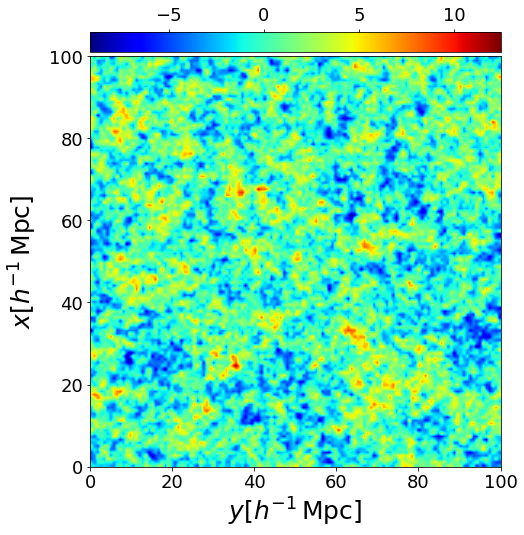

------------------------------->
Cosmic evolved field high resolution --->


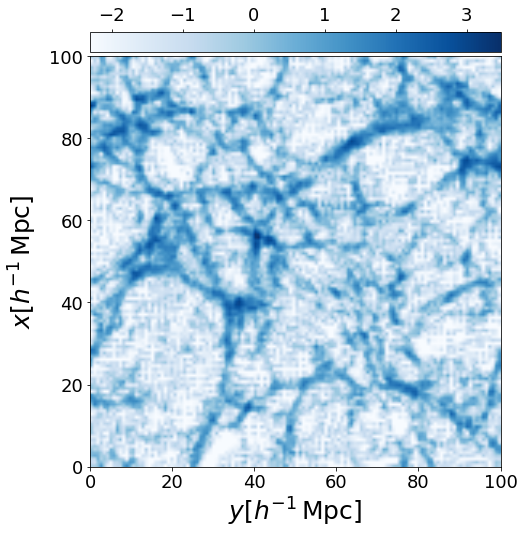

In [ ]:
#Small box simulation with improved PT model to see cosmic web

LHR = 100 # Box length [Mpc/h]
pkHR=pk1Dto3D(filename, nc, LHR, Nb)
deltadmGHR=create_GaussianField(pkHR, seed, nc, normDelta)

print("------------------------------->")
print("Initial Field high resolution --->")
plotdiagn(deltadmGHR, 0, nc, LHR, Nb, vmin, vmax, False, False) 

thetaHR=alpt(L, nc, deltadmGHR)

psiHR = compute_zeld(LHR, nc, thetaHR)

posHR=displace_particles(LHR, nc, psiHR)

densHR=cic_particles(LHR, nc, posHR)

deltadmHR=densHR/np.mean(densHR)-1

print("------------------------------->")
print("Cosmic evolved field high resolution --->")
plotdiagn(deltadmHR, 0, nc, LHR, Nb, vmin, vmax, True, False) 

------------------------------->
Input signal we aim to infer: Gaussian initial conditions--->


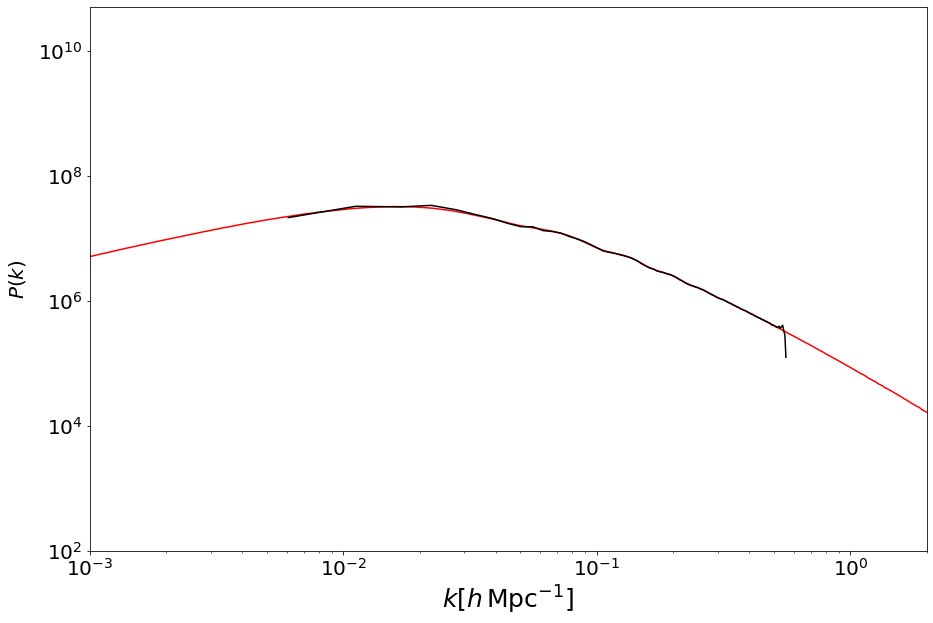

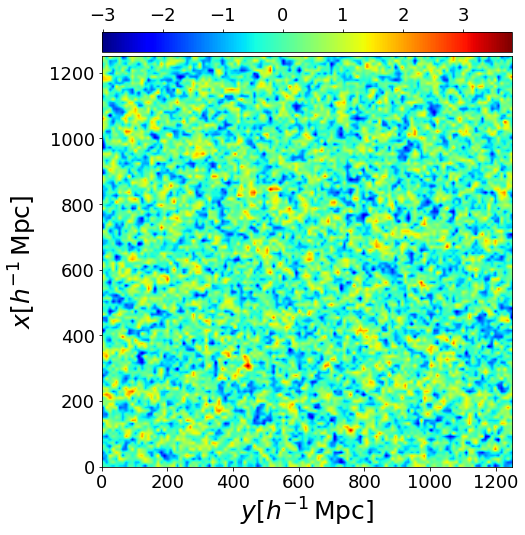

In [ ]:
#Then we produce the data in a lower resolution case to have cosmic volumes (>1 Gpc side)

np.random.seed(seed) 

pk=pk1Dto3D(filename, nc, L, Nb)

deltadmG=create_GaussianField(pk, seed, nc, normDelta)


print("------------------------------->")
print("Input signal we aim to infer: Gaussian initial conditions--->")
plotdiagn(deltadmG, 0, nc, L, Nb, vmin, vmax, False, True)

muG=-0.361677
------------------------------->
Cosmic evolved field --->


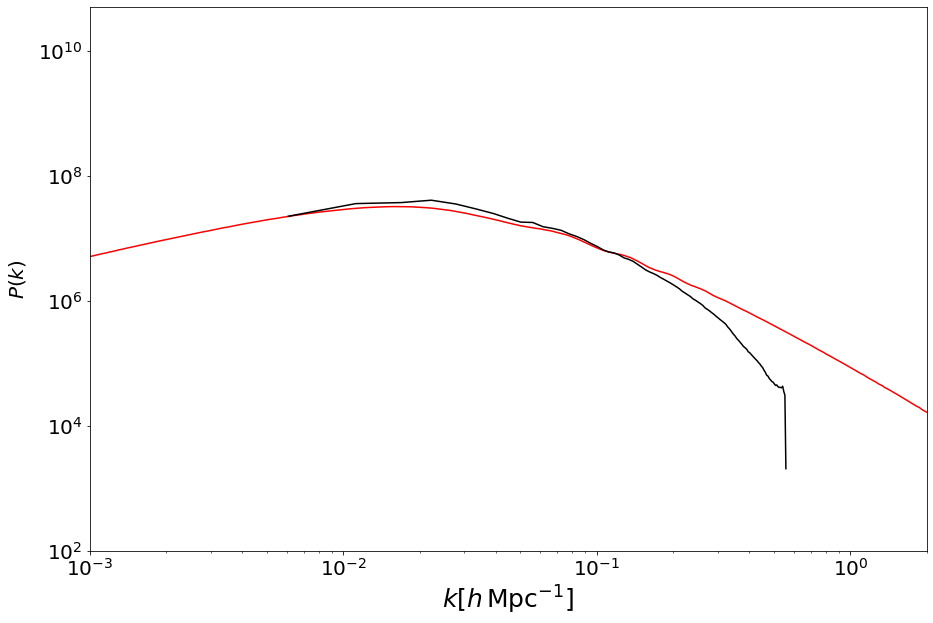

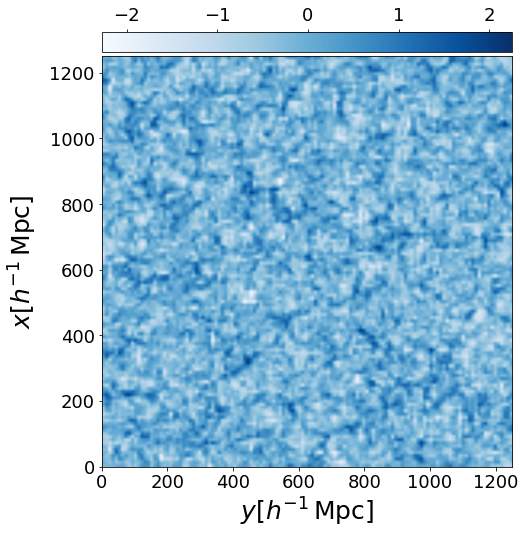

In [ ]:
muG=calc_mu(deltadmG, nc)
print("muG=%f"%(muG))

if inverseCrime==True:

    dens=np.exp(deltadmG+muG)-1

else:

    theta=alpt(L, nc, deltadmG)

    psi = compute_zeld(L, nc, theta)

    pos=displace_particles(L, nc, psi)

    dens=cic_particles(L, nc, pos)

deltadm=dens/np.mean(dens)-1

print("------------------------------->")
print("Cosmic evolved field --->")
plotdiagn(deltadm, 0, nc, L, Nb, vmin, vmax, True, True)  

NmeanG=0.279397 fmean=0.166097
------------------------------->
Input data--->


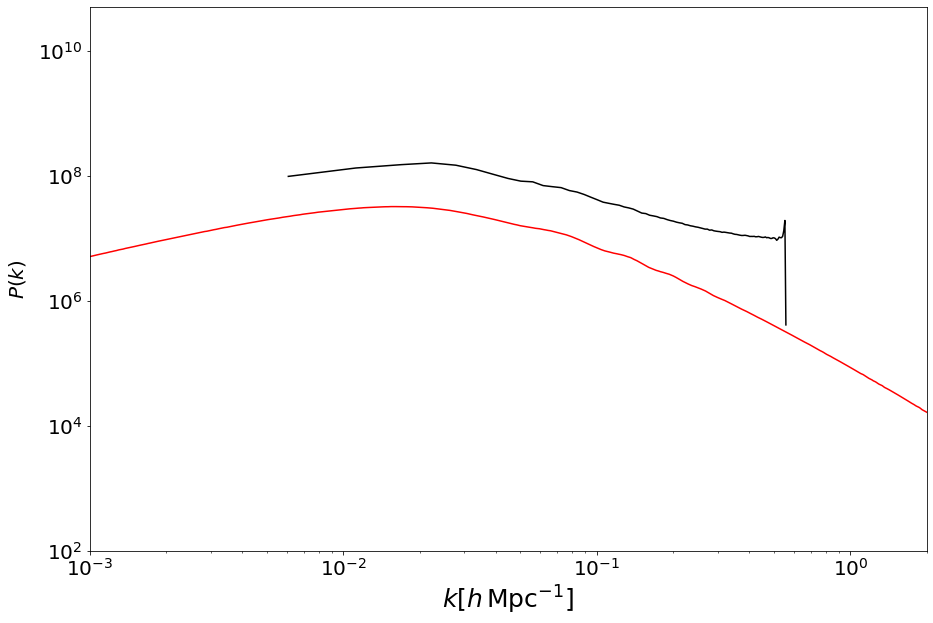

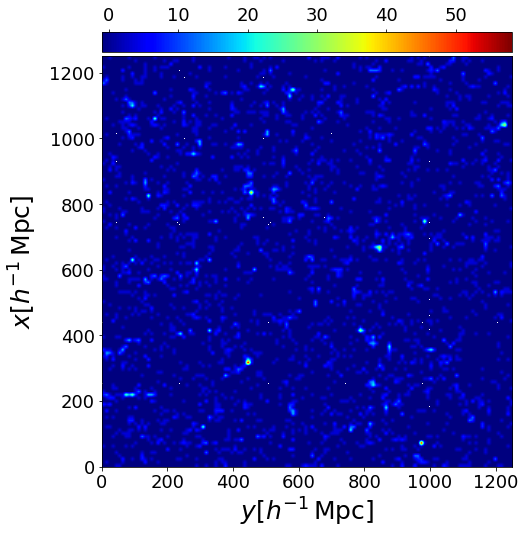

In [ ]:
fmean=NmeanG
(flag, fmean)=calc_fmean(deltadmG, NmeanG, nc, muG, bias)

print("NmeanG=%f"%(NmeanG),"fmean=%f"%(fmean))

rhoG=fmean*(1.+deltadm)**bias

Nobs=np.random.poisson(rhoG)
Nobs=np.asarray(Nobs, dtype = np.float32, order ='C')

deltaobs=Nobs/np.mean(Nobs)-1

vminn=np.min(deltaobs)
vmaxn=np.max(deltaobs)

print("------------------------------->")
print("Input data--->")
plotdiagn(deltaobs, 0, nc, L, Nb, vminn, vmaxn, False, True)



leapfrog-boost integrator
muG=-0.361677
------------------------------->
Bayesian inference--->
------------------------------->
---->iteration=1
mu=-0.000000
fmean=0.279397
leapfrog-boost integrator
HMC evaluations=1
logk=1041572.326982 logp=9730.318753 loglike=582337.652124
logk=1047703.208534 logp=0.000000 loglike=585937.500000
Hf=1633640.297860 Hi=1633640.708534
dH=-0.410674
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=4


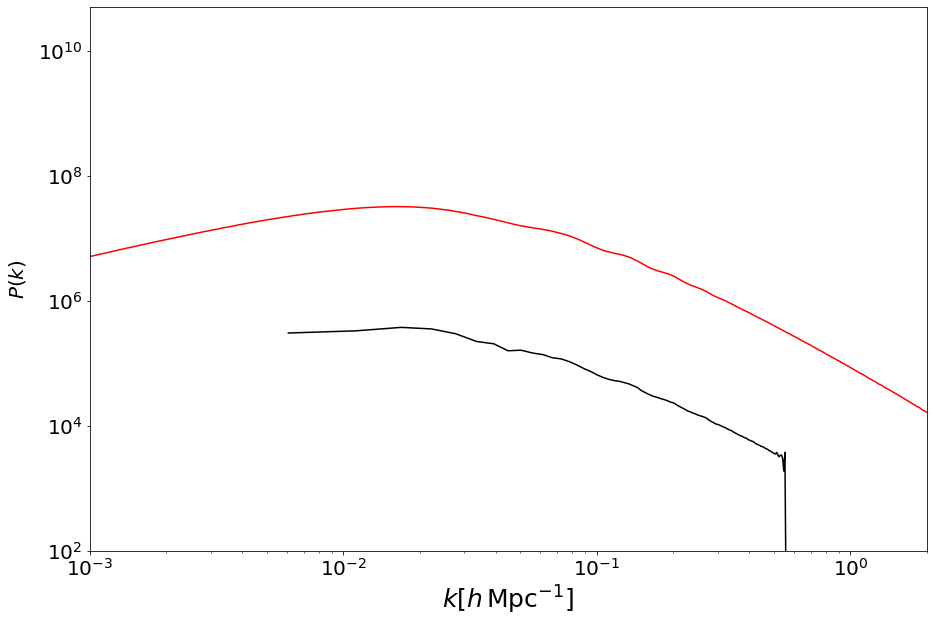

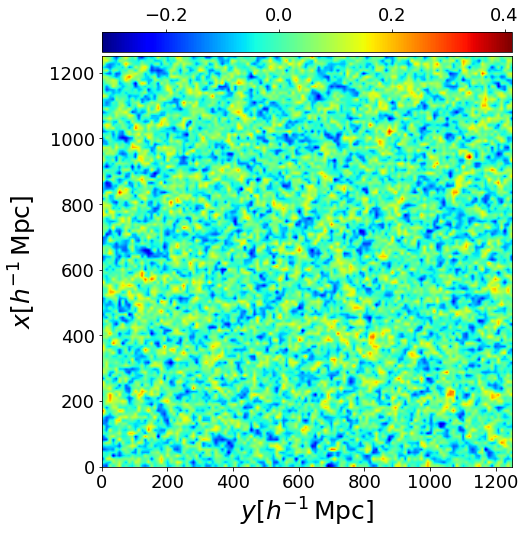

------------------------------->
---->iteration=2
mu=-0.003386
fmean=0.278950
leapfrog-boost integrator
HMC evaluations=3
logk=985698.714549 logp=104605.887991 loglike=548782.186395
logk=1048542.991726 logp=9730.318753 loglike=580819.592172
Hf=1639086.788934 Hi=1639092.902651
dH=-6.113717
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=14


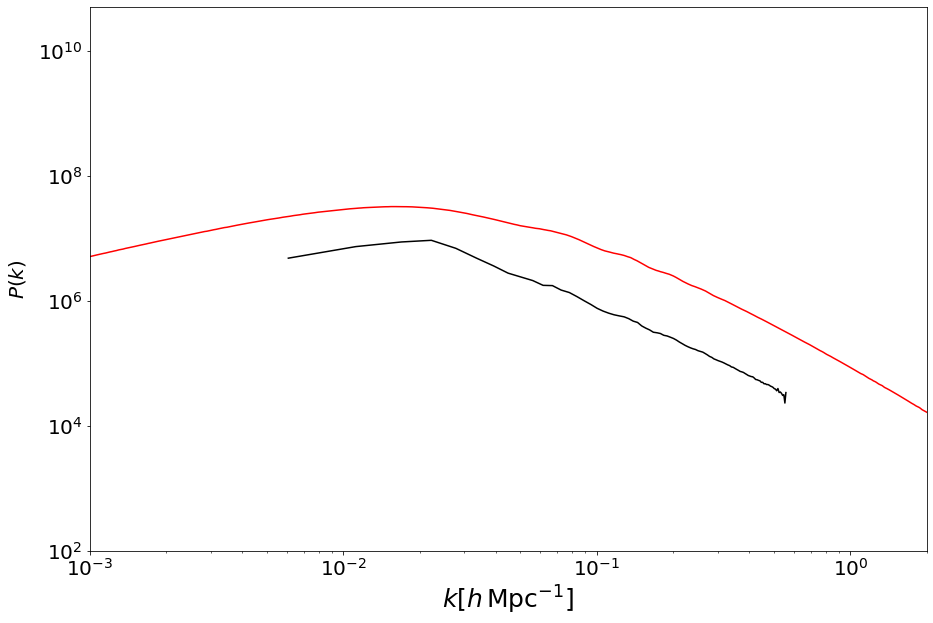

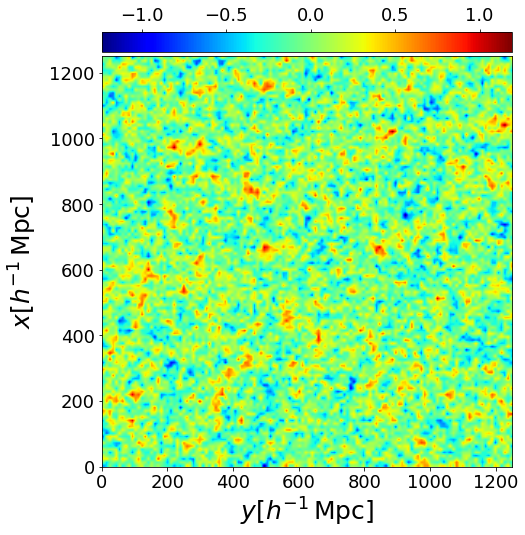

------------------------------->
---->iteration=3
mu=-0.038240
fmean=0.274364
leapfrog-boost integrator
HMC evaluations=2
logk=1020440.340683 logp=144823.144704 loglike=519890.145518
logk=1048551.934704 logp=104605.887991 loglike=531998.061521
Hf=1685153.630905 Hi=1685155.884215
dH=-2.253311
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=21


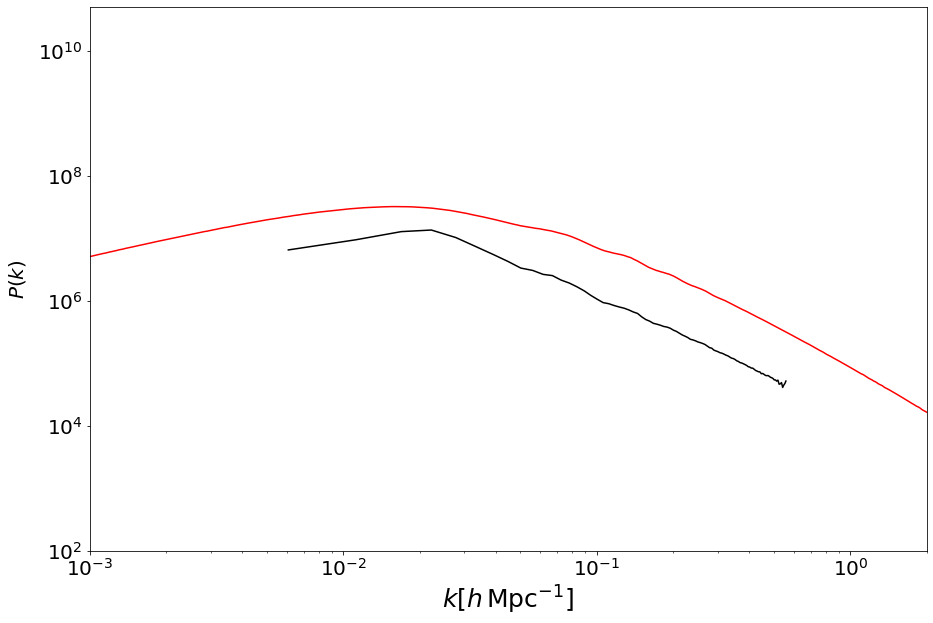

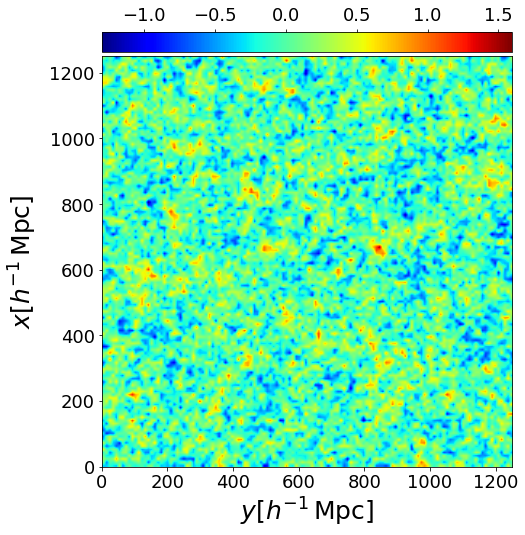

------------------------------->
---->iteration=4
mu=-0.053477
fmean=0.272353
leapfrog-boost integrator
HMC evaluations=3
logk=986885.059522 logp=229214.973486 loglike=491673.753041
logk=1050170.220741 logp=144823.144704 loglike=512785.598265
Hf=1707773.786049 Hi=1707778.963710
dH=-5.177661
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=31


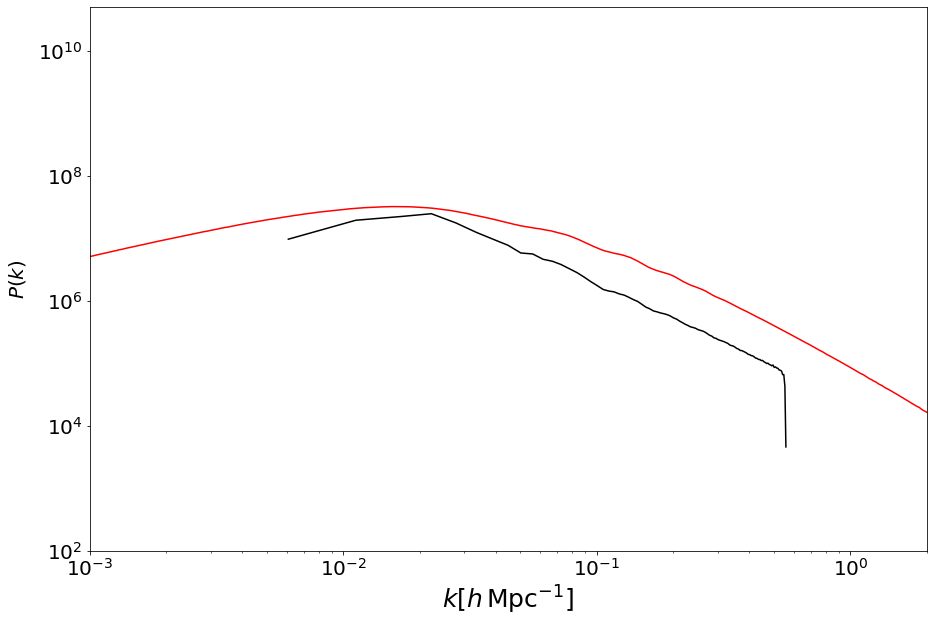

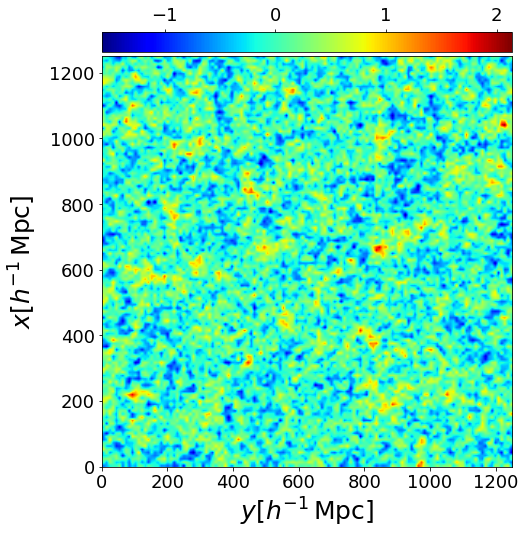

------------------------------->
---->iteration=5
mu=-0.086575
fmean=0.267931
leapfrog-boost integrator
HMC evaluations=2
logk=1021621.070621 logp=264203.486363 loglike=467645.553996
logk=1048854.279389 logp=229214.973486 loglike=475402.618476
Hf=1753470.110980 Hi=1753471.871351
dH=-1.760371
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=38


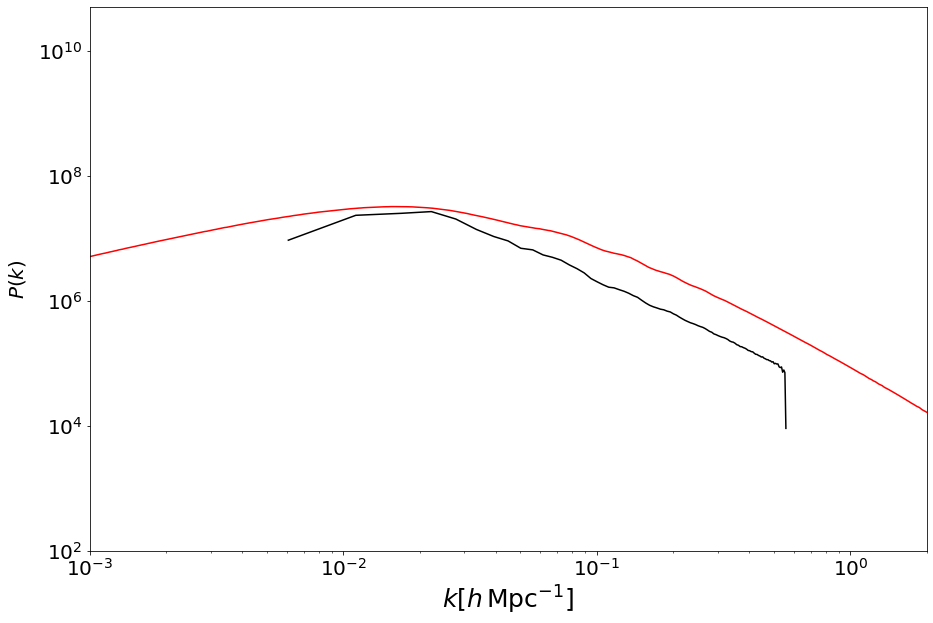

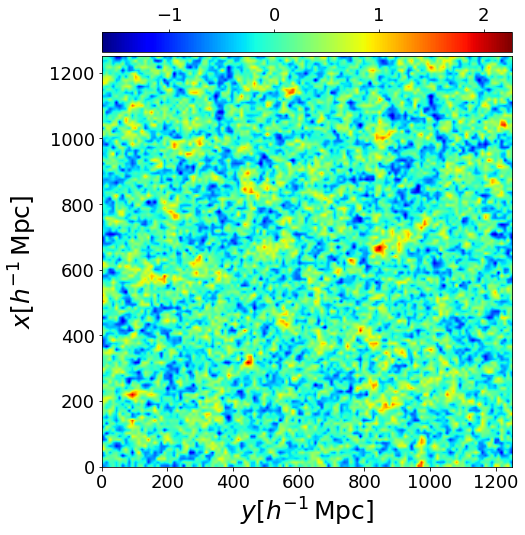

------------------------------->
---->iteration=6
mu=-0.100047
fmean=0.266141
leapfrog-boost integrator
HMC evaluations=3
logk=994104.876224 logp=333140.826932 loglike=447510.398700
logk=1049286.380125 logp=264203.486363 loglike=461269.597592
Hf=1774756.101855 Hi=1774759.464081
dH=-3.362225
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=48


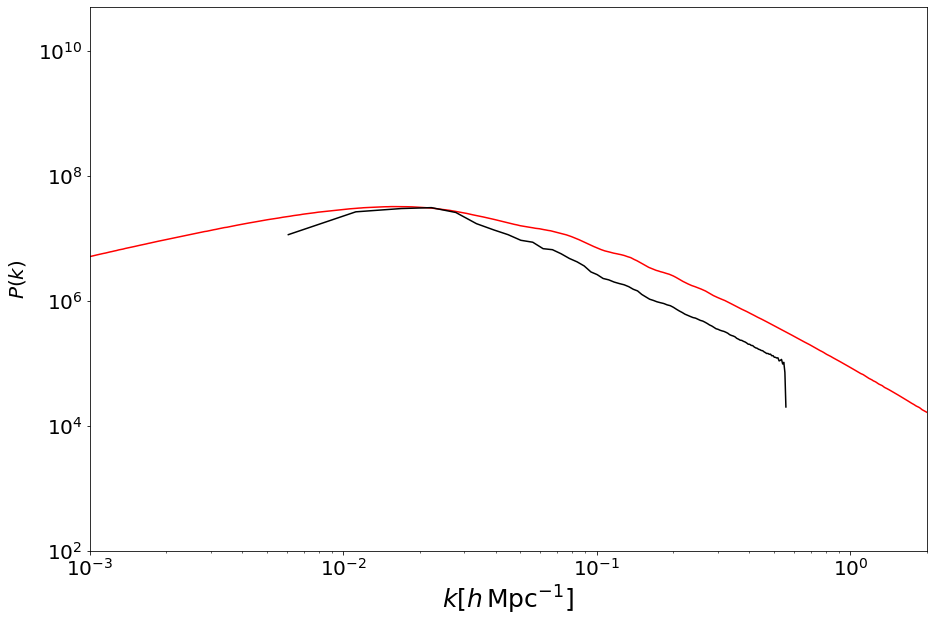

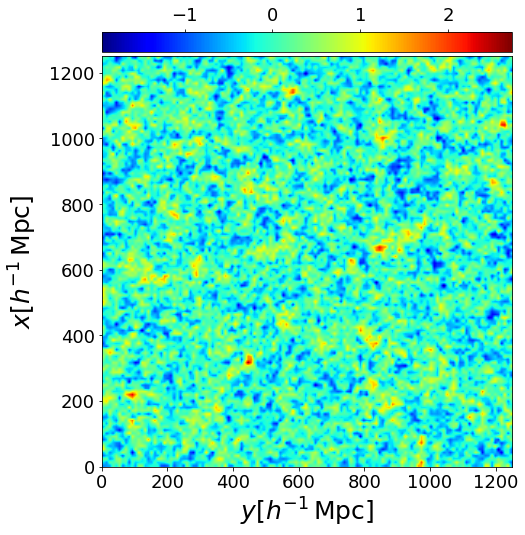

------------------------------->
---->iteration=7
mu=-0.126882
fmean=0.262575
leapfrog-boost integrator
HMC evaluations=2
logk=1025608.112564 logp=359224.486241 loglike=429794.105805
logk=1047129.794901 logp=333140.826932 loglike=434357.107752
Hf=1814626.704609 Hi=1814627.729584
dH=-1.024975
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=55


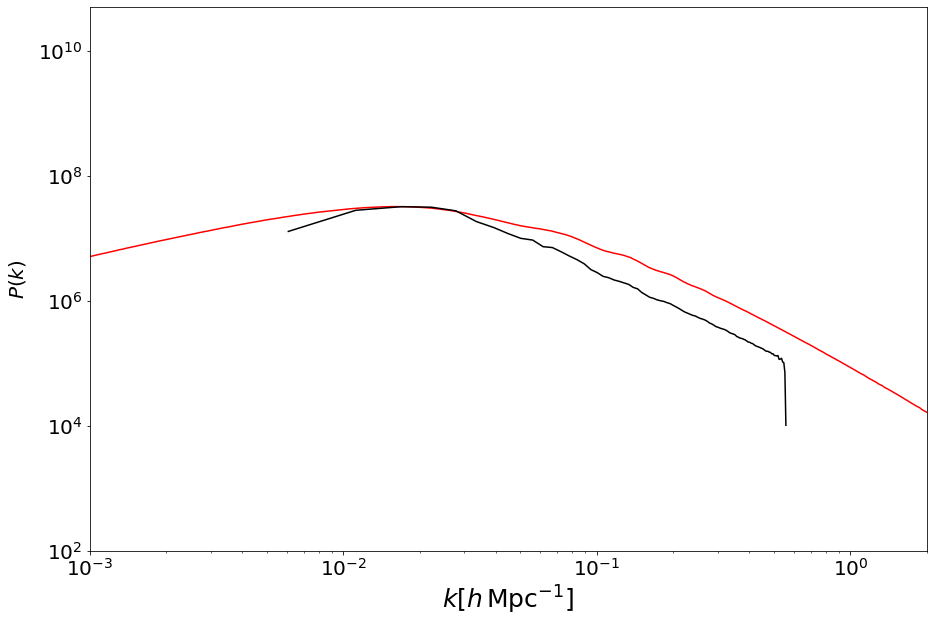

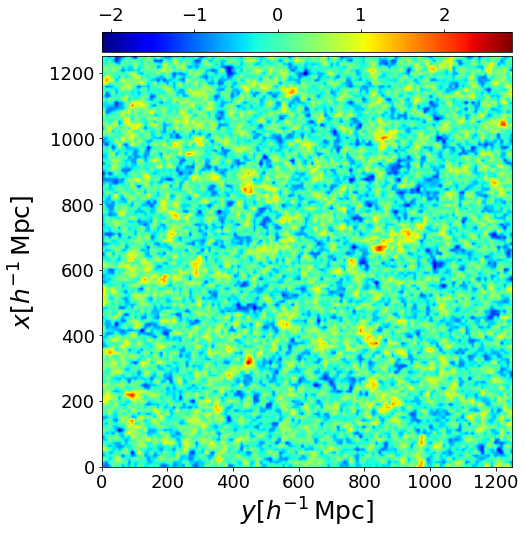

------------------------------->
---->iteration=8
mu=-0.136855
fmean=0.261274
leapfrog-boost integrator
HMC evaluations=3
logk=1006679.169359 logp=410369.216319 loglike=415469.238037
logk=1048187.638073 logp=359224.486241 loglike=425107.332735
Hf=1832517.623715 Hi=1832519.457048
dH=-1.833333
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=65


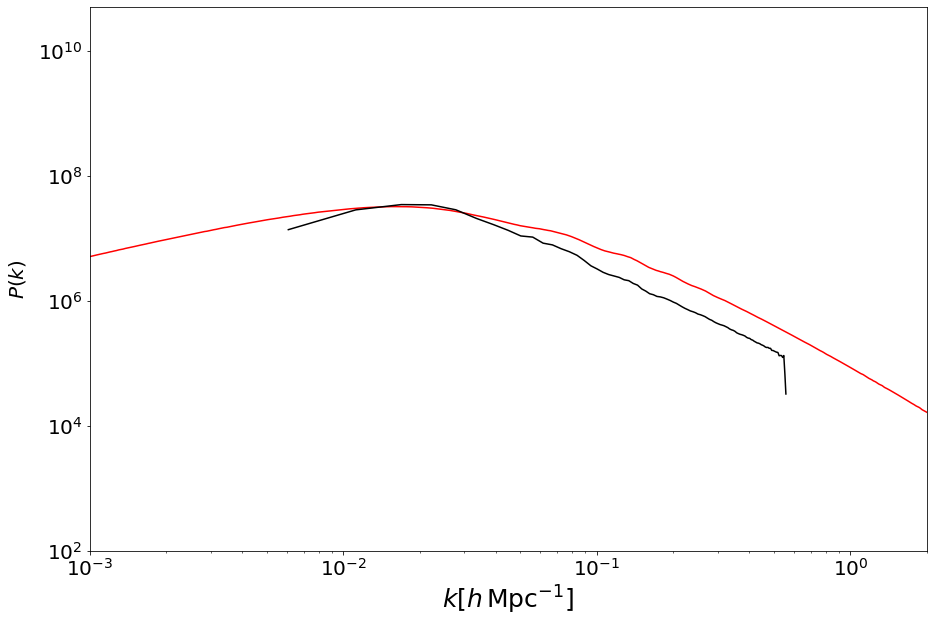

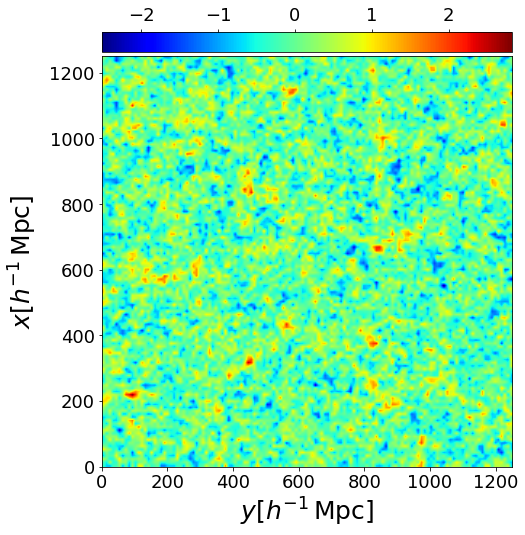

------------------------------->
---->iteration=9
mu=-0.155936
fmean=0.258805
leapfrog-boost integrator
HMC evaluations=3
logk=1002755.140835 logp=467431.713401 loglike=396811.037174
logk=1050301.267240 logp=410369.216319 loglike=406329.660206
Hf=1866997.891410 Hi=1867000.143765
dH=-2.252354
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=75


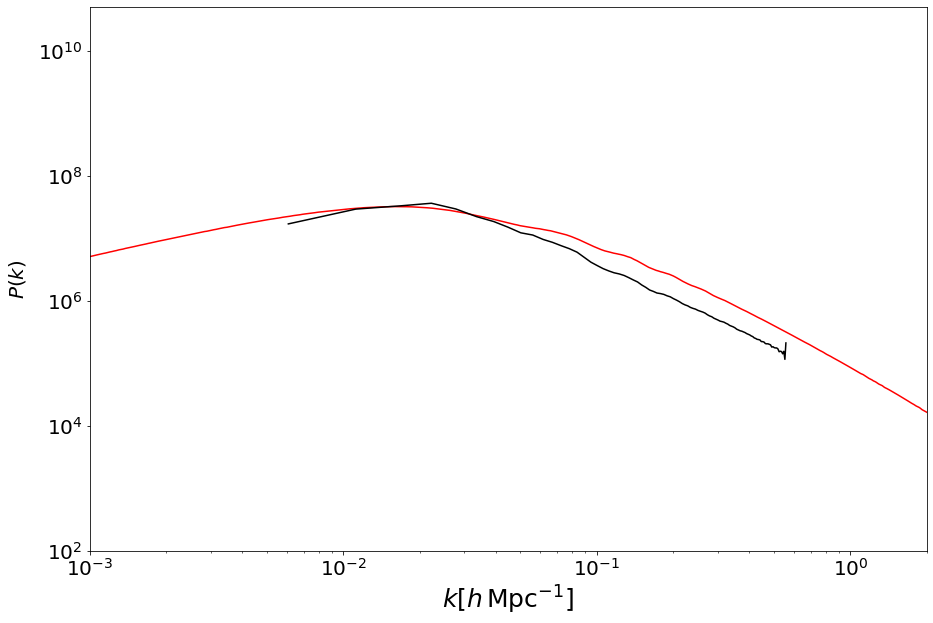

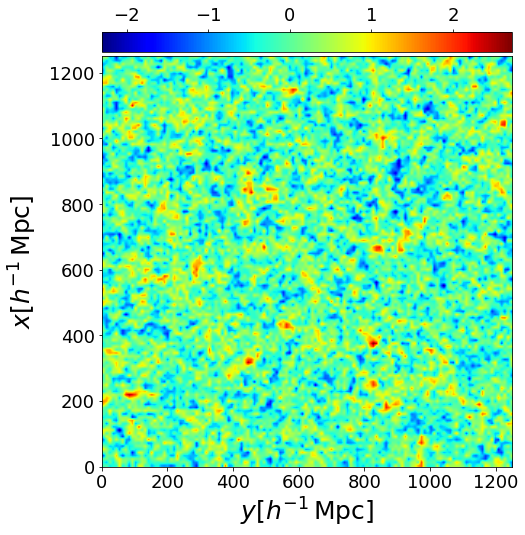

------------------------------->
---->iteration=10
mu=-0.176634
fmean=0.256193
leapfrog-boost integrator
HMC evaluations=2
logk=1030863.315834 logp=487096.113303 loglike=383814.373770
logk=1047386.272724 logp=467431.713401 loglike=386956.418228
Hf=1901773.802907 Hi=1901774.404352
dH=-0.601445
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=82


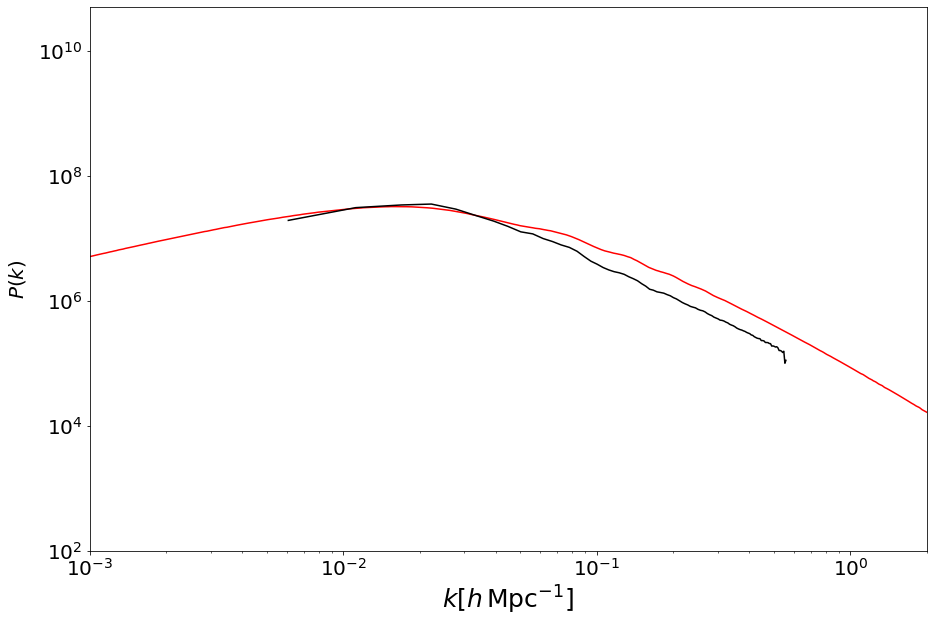

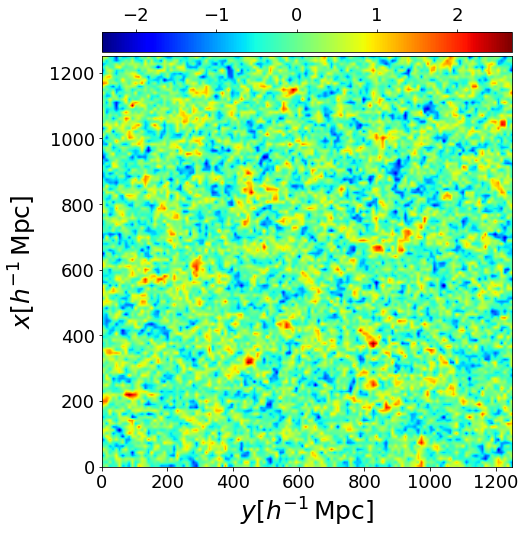

------------------------------->
---->iteration=11
mu=-0.183638
fmean=0.255329
leapfrog-boost integrator
HMC evaluations=1
logk=1044369.116152 logp=492204.799985 loglike=379744.587519
logk=1048613.662711 logp=487096.113303 loglike=380608.907482
Hf=1916318.503656 Hi=1916318.683496
dH=-0.179841
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=86


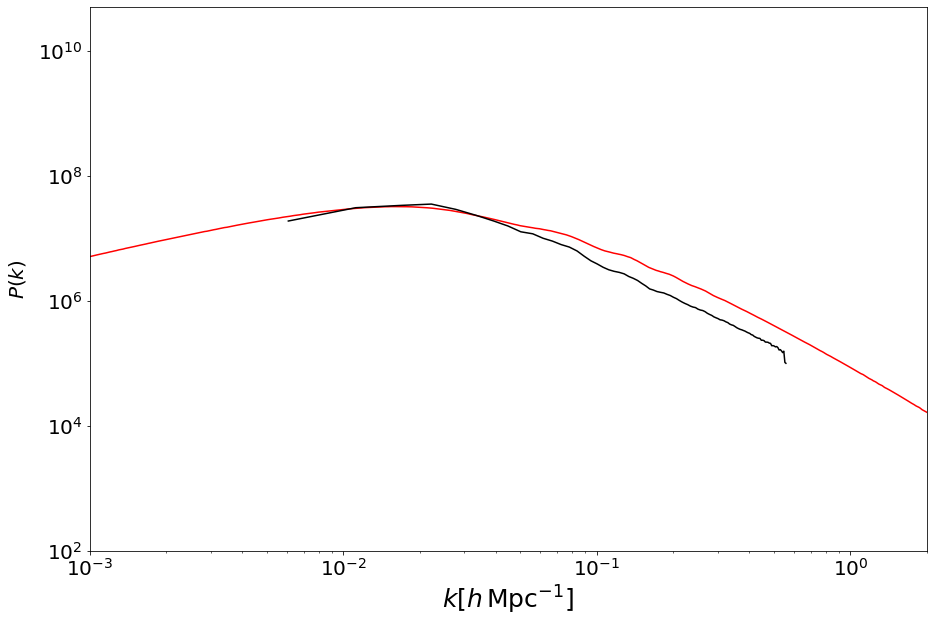

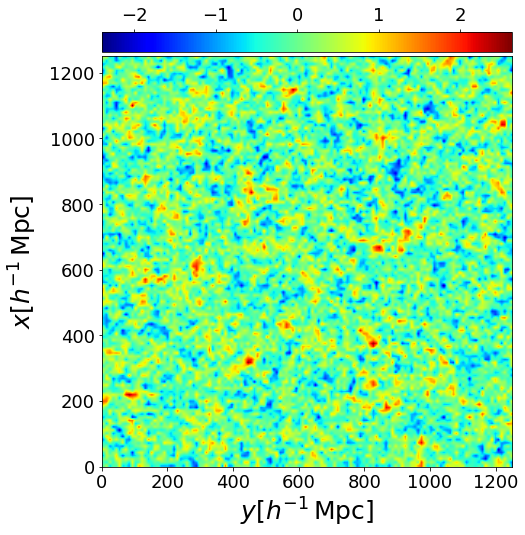

------------------------------->
---->iteration=12
mu=-0.185466
fmean=0.255101
leapfrog-boost integrator
HMC evaluations=3
logk=1012152.916451 logp=534849.285635 loglike=372230.352927
logk=1048117.564445 logp=492204.799985 loglike=378911.546933
Hf=1919232.555013 Hi=1919233.911364
dH=-1.356350
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=96


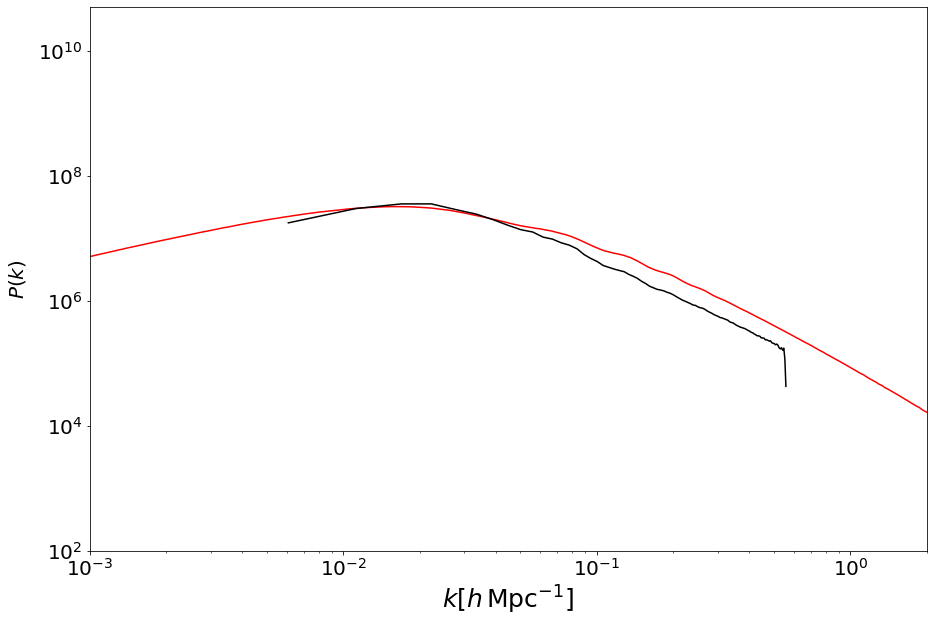

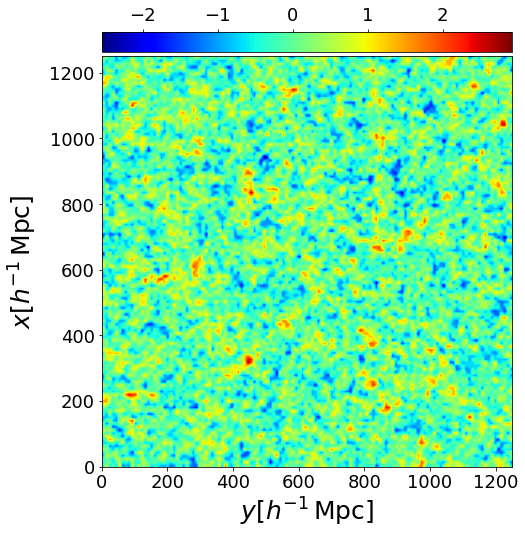

------------------------------->
---->iteration=13
mu=-0.200346
fmean=0.253286
leapfrog-boost integrator
HMC evaluations=1
logk=1044474.184846 logp=539622.345735 loglike=364462.730478
logk=1048386.984409 logp=534849.285635 loglike=365323.151742
Hf=1948559.261059 Hi=1948559.421785
dH=-0.160727
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=100


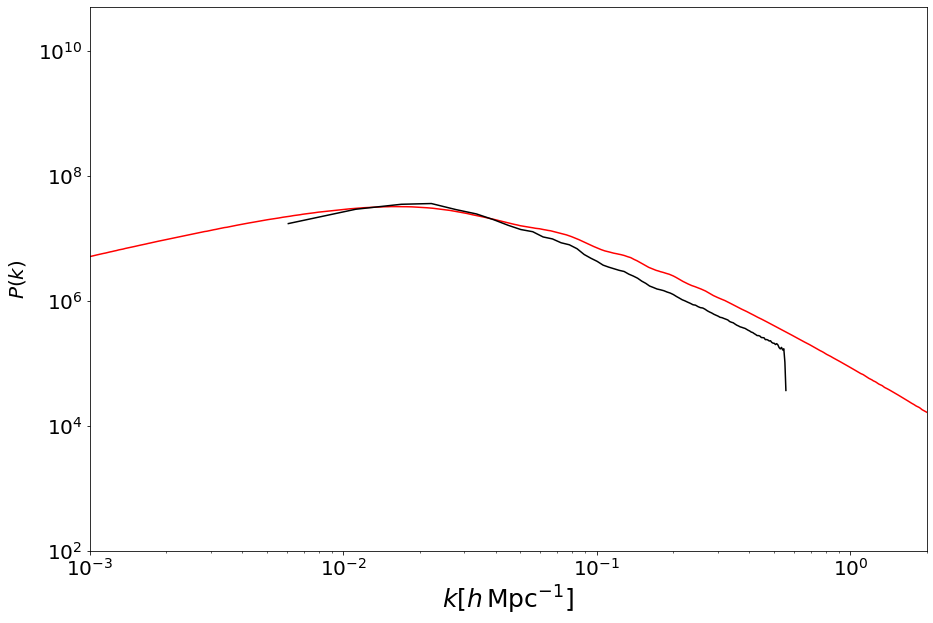

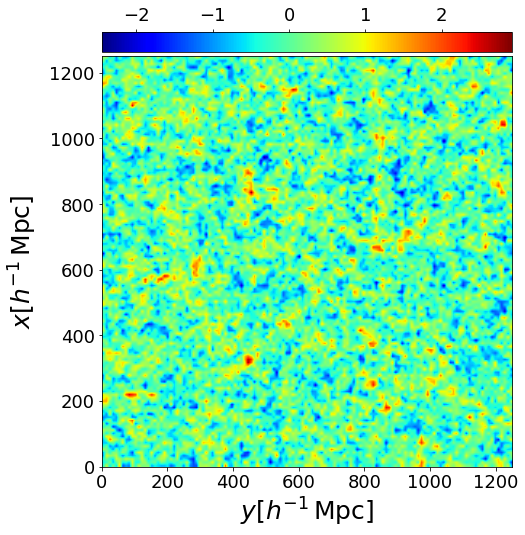

------------------------------->
---->iteration=14
mu=-0.202010
fmean=0.253082
leapfrog-boost integrator
HMC evaluations=2
logk=1036415.225331 logp=555124.933803 loglike=361090.740011
logk=1049300.058226 logp=539622.345735 loglike=363708.900159
Hf=1952630.899145 Hi=1952631.304120
dH=-0.404975
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=107


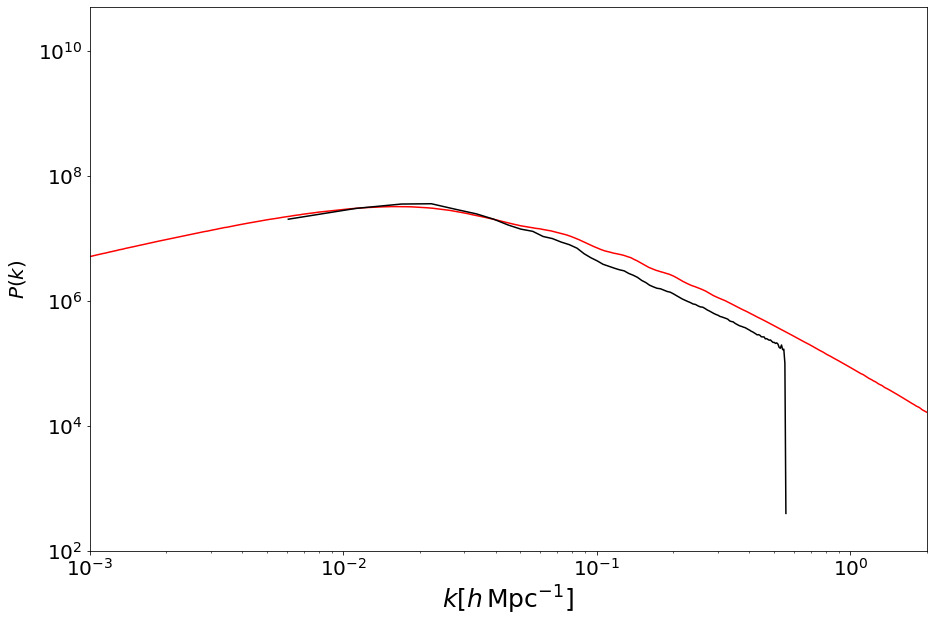

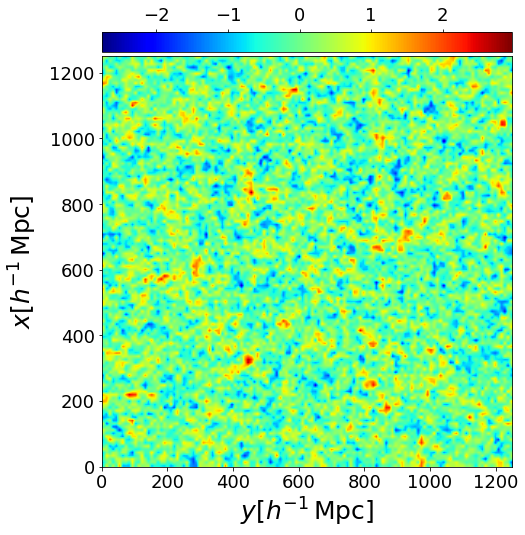

------------------------------->
---->iteration=15
mu=-0.207254
fmean=0.252443
leapfrog-boost integrator
HMC evaluations=2
logk=1031194.184070 logp=573650.868586 loglike=355786.629567
logk=1046805.649620 logp=555124.933803 loglike=358701.667662
Hf=1960631.682223 Hi=1960632.251084
dH=-0.568861
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=114


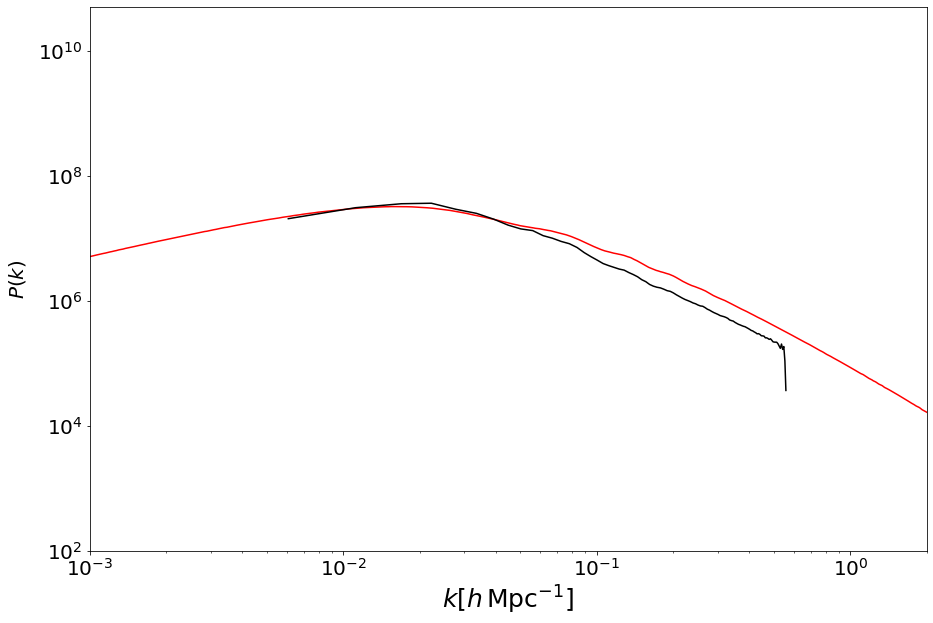

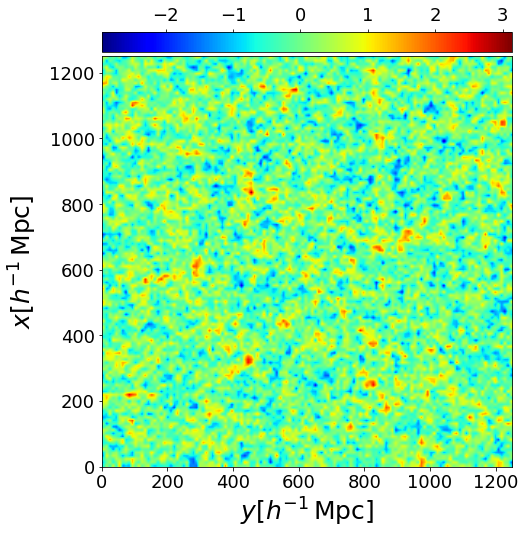

------------------------------->
---->iteration=16
mu=-0.213457
fmean=0.251711
leapfrog-boost integrator
HMC evaluations=2
logk=1033631.656155 logp=593960.503742 loglike=349704.397132
logk=1050641.637759 logp=573650.868586 loglike=353004.855206
Hf=1977296.557029 Hi=1977297.361552
dH=-0.804522
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=121


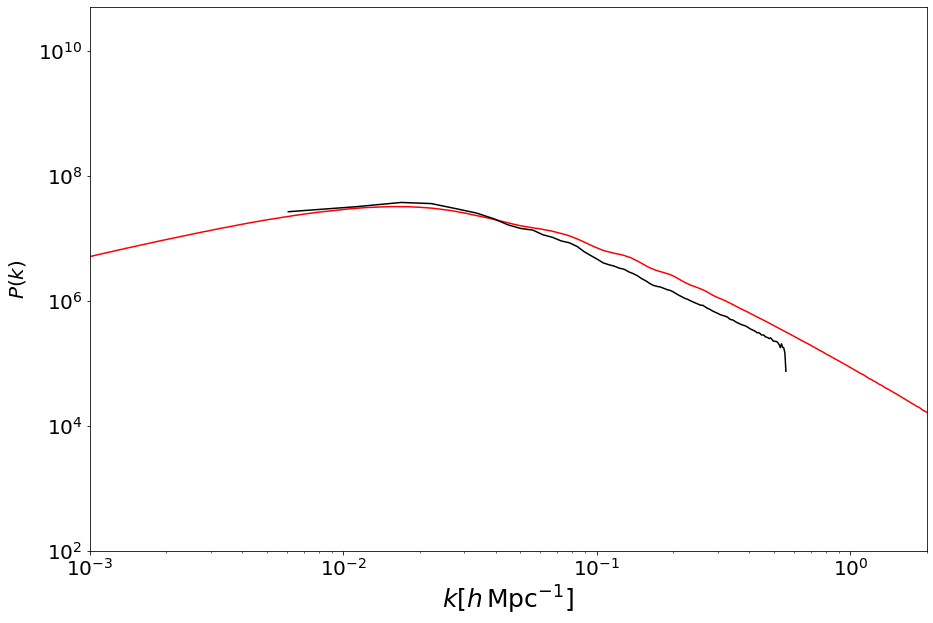

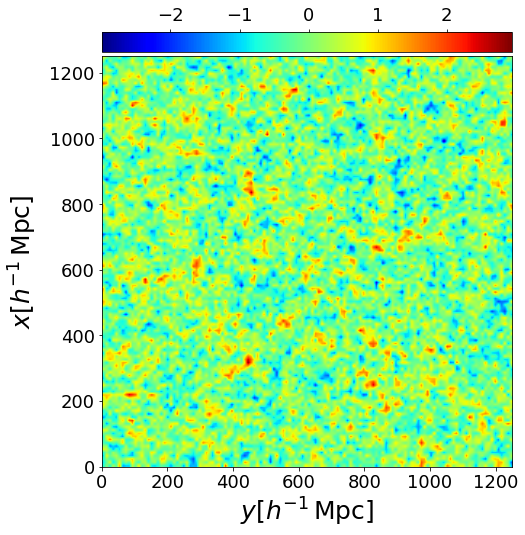

------------------------------->
---->iteration=17
mu=-0.220589
fmean=0.250844
leapfrog-boost integrator
HMC evaluations=2
logk=1037231.004831 logp=608104.239118 loglike=343959.616176
logk=1048901.553030 logp=593960.503742 loglike=346433.182162
Hf=1989294.860124 Hi=1989295.238934
dH=-0.378810
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=128


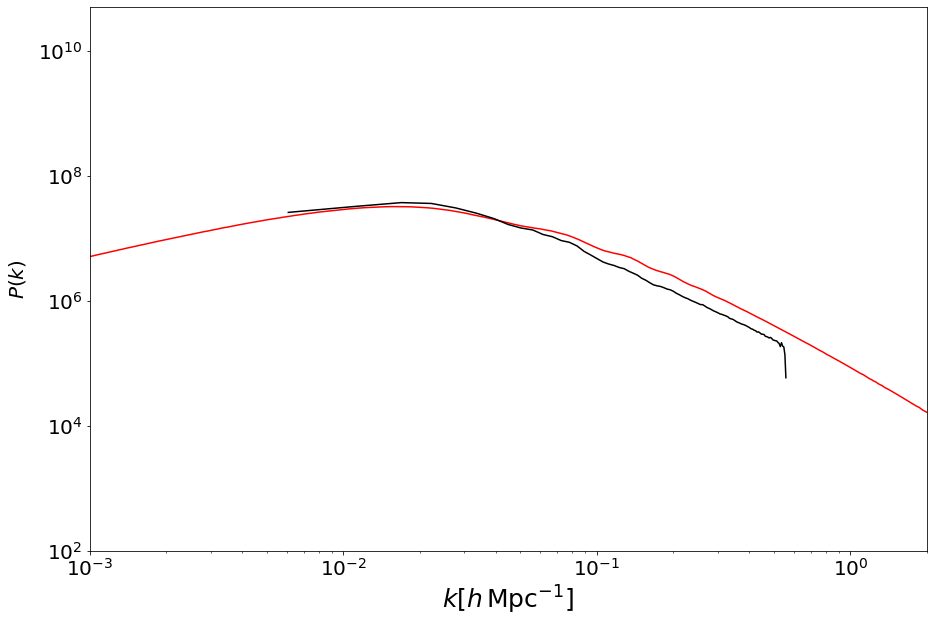

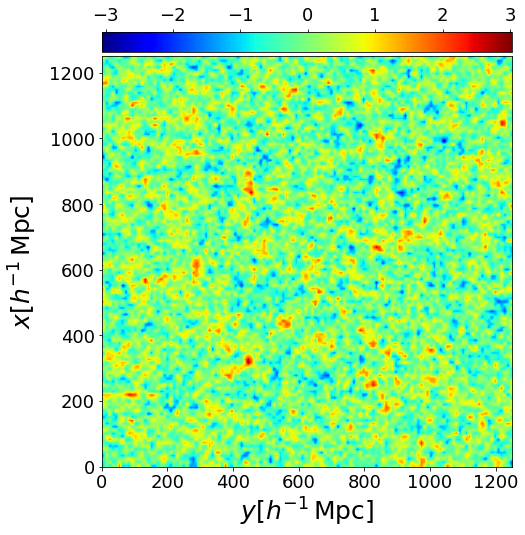

------------------------------->
---->iteration=18
mu=-0.225213
fmean=0.250336
leapfrog-boost integrator
HMC evaluations=4
logk=1008643.750528 logp=656241.113059 loglike=333904.176277
logk=1048712.821608 logp=608104.239118 loglike=341973.212304
Hf=1998789.039864 Hi=1998790.273029
dH=-1.233165
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=141


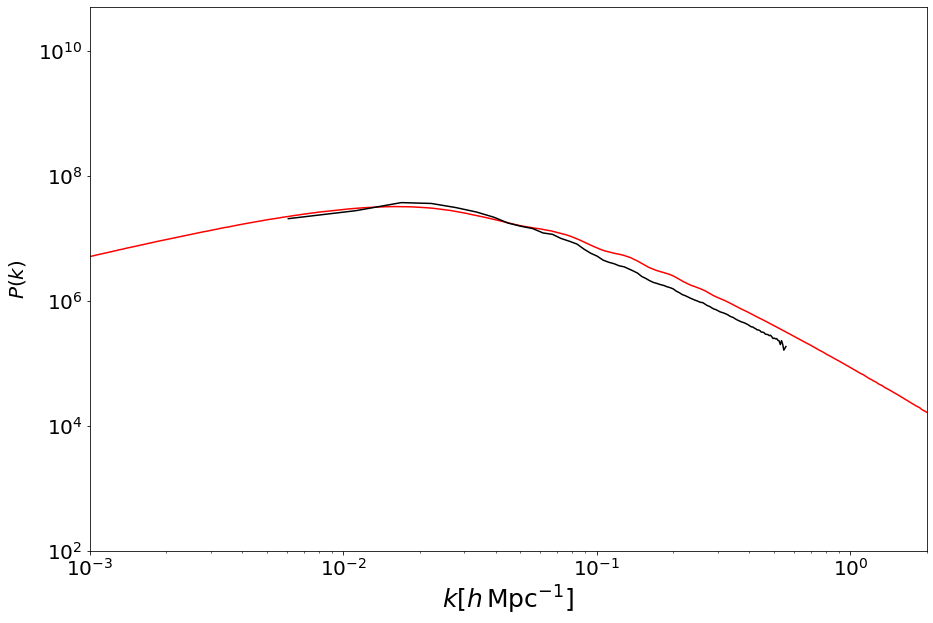

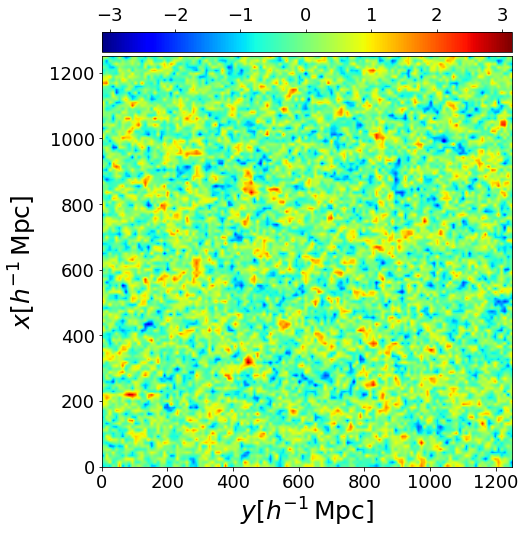

------------------------------->
---->iteration=19
mu=-0.241758
fmean=0.248427
leapfrog-boost integrator
HMC evaluations=2
logk=1038230.179989 logp=667610.617904 loglike=324379.443467
logk=1047607.375253 logp=656241.113059 loglike=326372.020707
Hf=2030220.241360 Hi=2030220.509020
dH=-0.267659
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=148


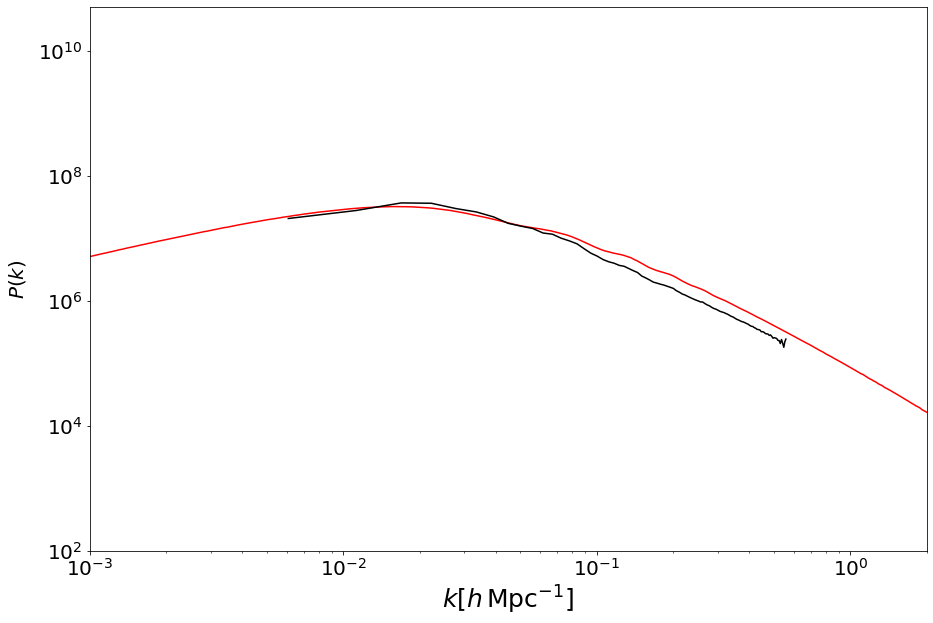

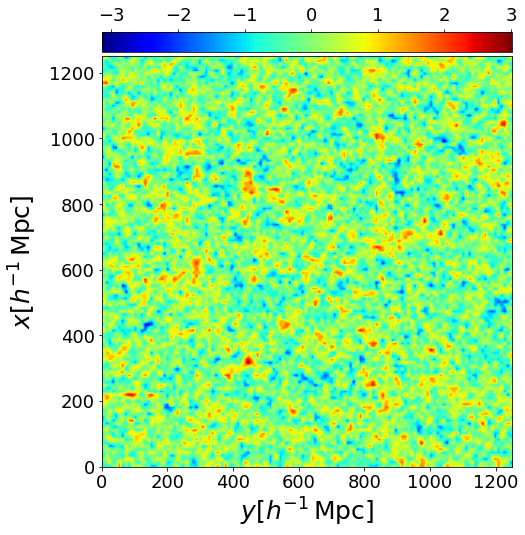

------------------------------->
---->iteration=20
mu=-0.245298
fmean=0.248049
leapfrog-boost integrator
HMC evaluations=3
logk=1021694.502865 logp=698216.603361 loglike=317613.416138
logk=1047035.372678 logp=667610.617904 loglike=322879.402823
Hf=2037524.522364 Hi=2037525.393406
dH=-0.871042
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=158


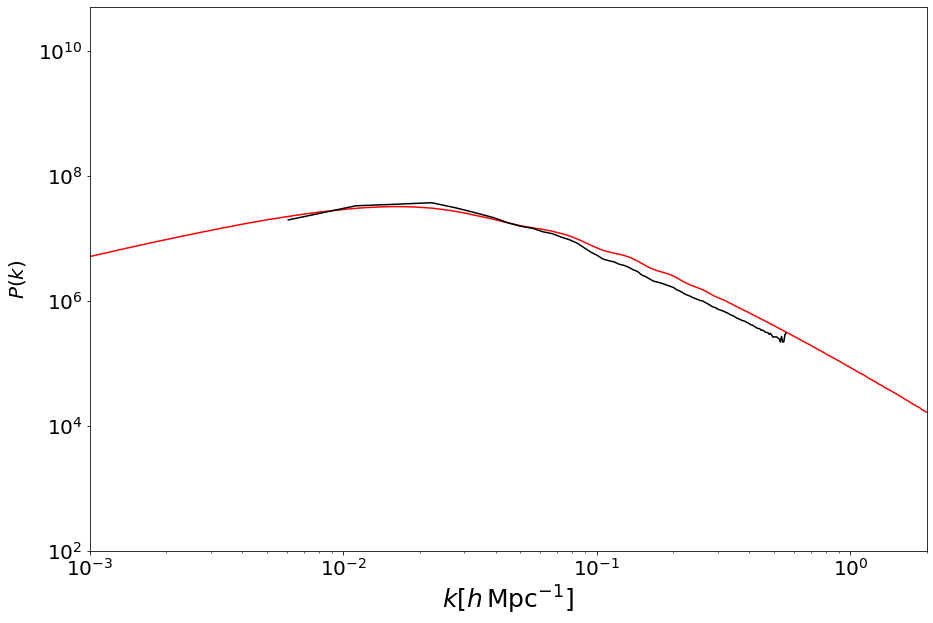

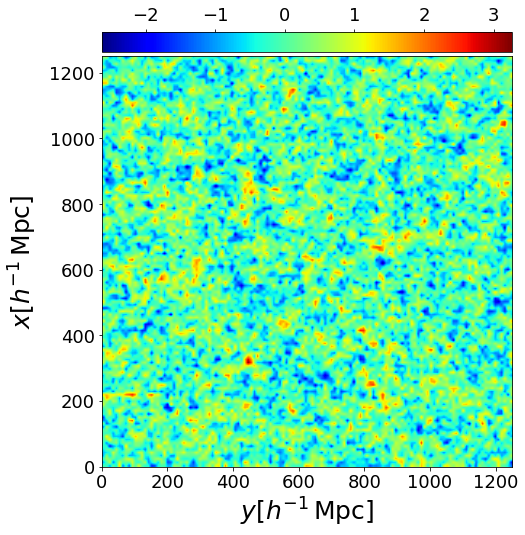

------------------------------->
---->iteration=21
mu=-0.254724
fmean=0.247021
leapfrog-boost integrator
HMC evaluations=4
logk=1016403.519800 logp=739528.704567 loglike=305991.345626
logk=1050197.249102 logp=698216.603361 loglike=313510.816345
Hf=2061923.569993 Hi=2061924.668809
dH=-1.098815
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=171


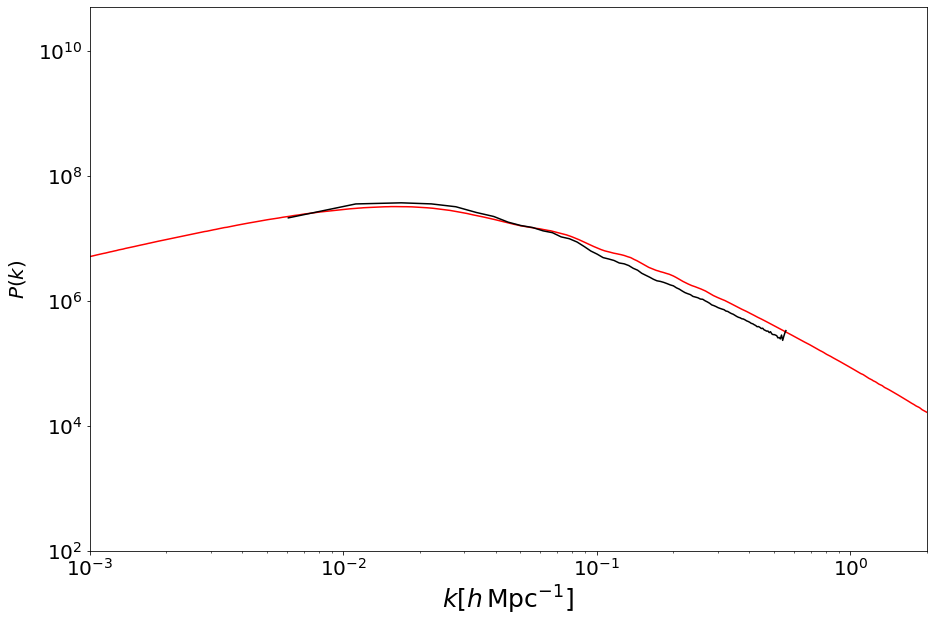

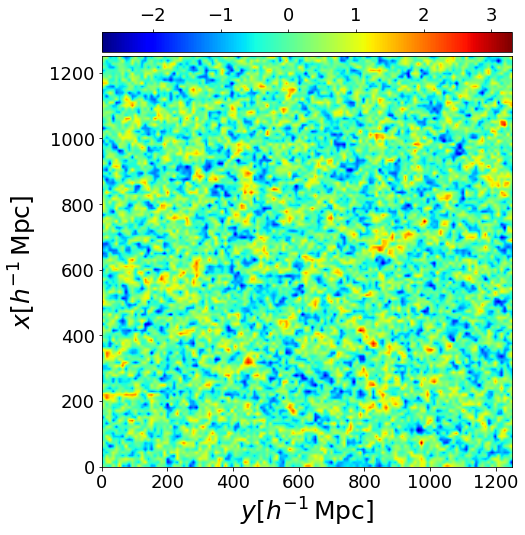

------------------------------->
---->iteration=22
mu=-0.268200
fmean=0.245514
leapfrog-boost integrator
HMC evaluations=4
logk=1016711.763984 logp=780367.941387 loglike=292068.008136
logk=1049655.178896 logp=739528.704567 loglike=299965.005527
Hf=2089147.713508 Hi=2089148.888991
dH=-1.175484
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=184


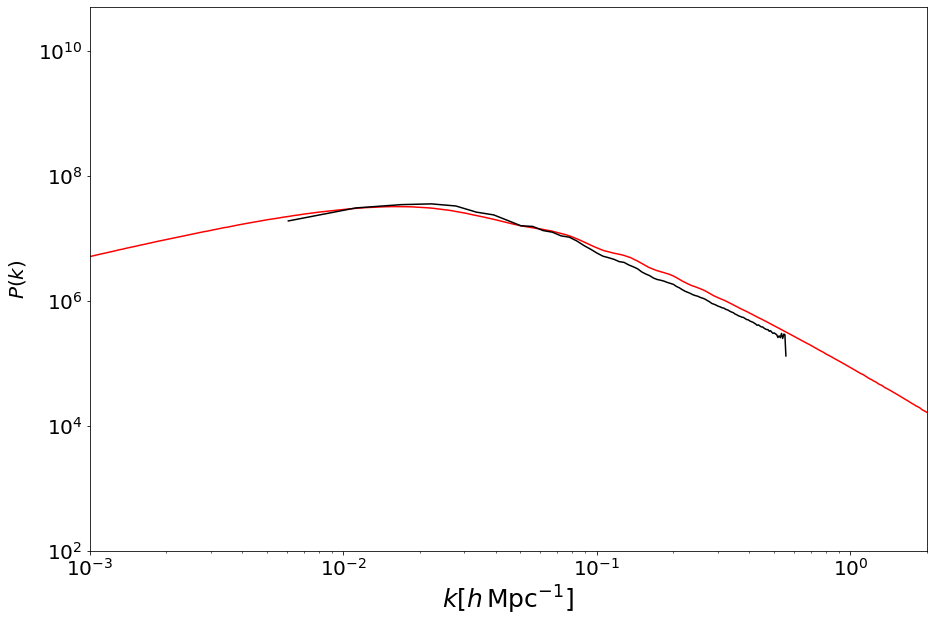

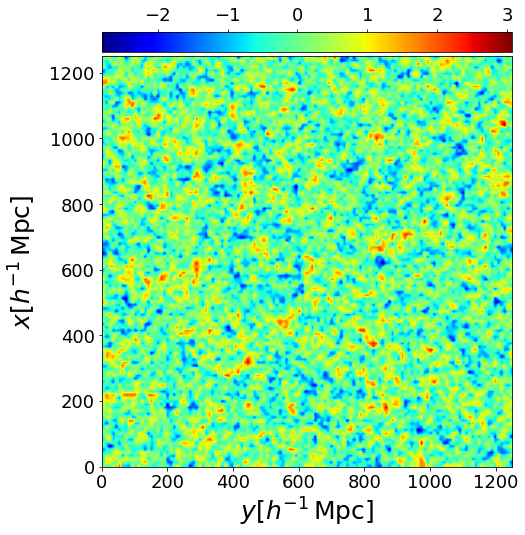

------------------------------->
---->iteration=23
mu=-0.280871
fmean=0.244194
leapfrog-boost integrator
HMC evaluations=1
logk=1047740.339105 logp=782620.921755 loglike=286245.516332
logk=1049608.212418 logp=780367.941387 loglike=286630.675936
Hf=2116606.777192 Hi=2116606.829741
dH=-0.052549
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=188


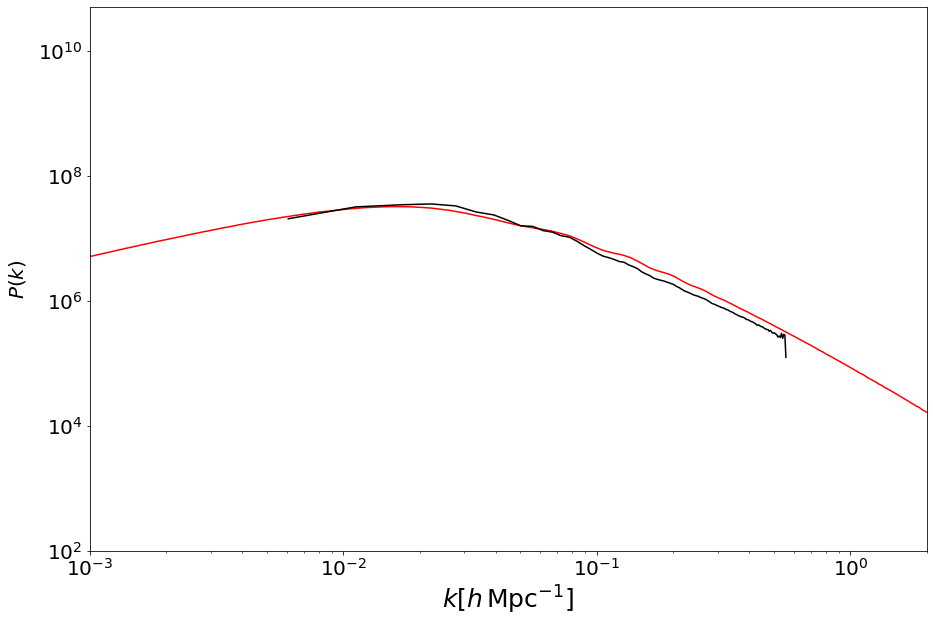

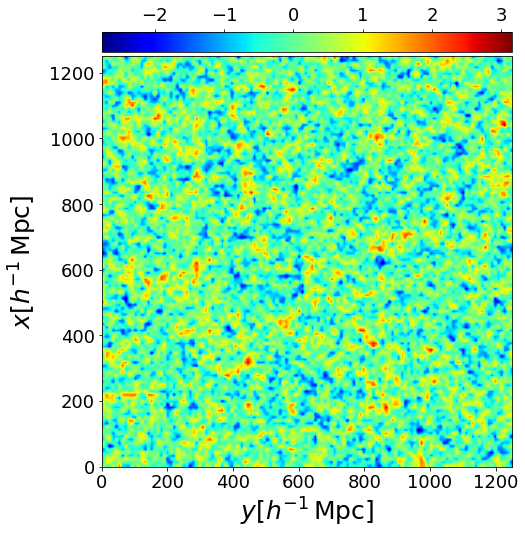

------------------------------->
---->iteration=24
mu=-0.281561
fmean=0.244116
leapfrog-boost integrator
HMC evaluations=2
logk=1040454.426301 logp=792188.433619 loglike=284108.737173
logk=1048190.847698 logp=782620.921755 loglike=285940.116244
Hf=2116751.597092 Hi=2116751.885697
dH=-0.288605
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=195


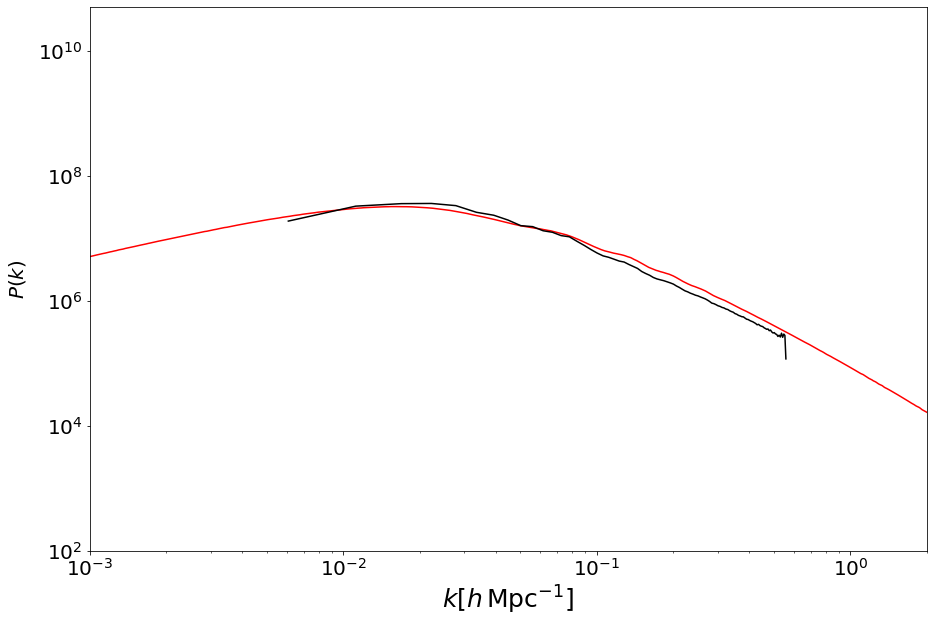

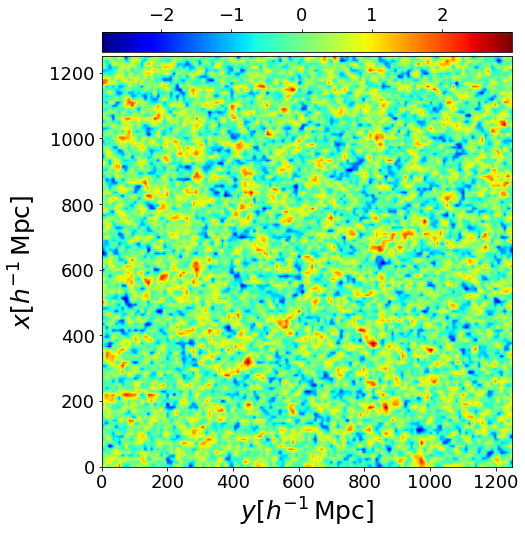

------------------------------->
---->iteration=25
mu=-0.284422
fmean=0.243806
leapfrog-boost integrator
HMC evaluations=2
logk=1042735.814558 logp=799438.963131 loglike=281339.714978
logk=1048451.138735 logp=792188.433619 loglike=282875.090393
Hf=2123514.492668 Hi=2123514.662747
dH=-0.170079
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=202


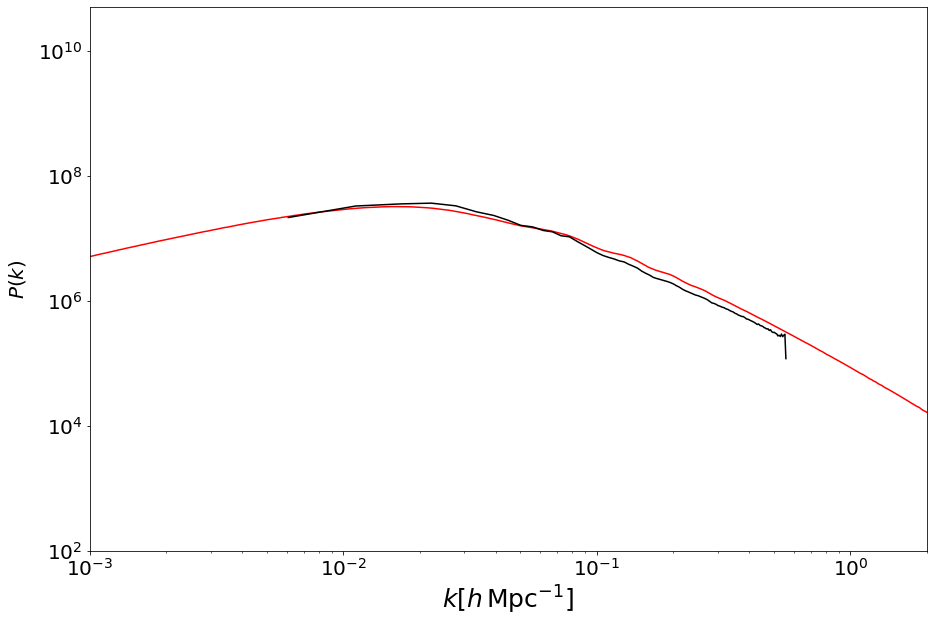

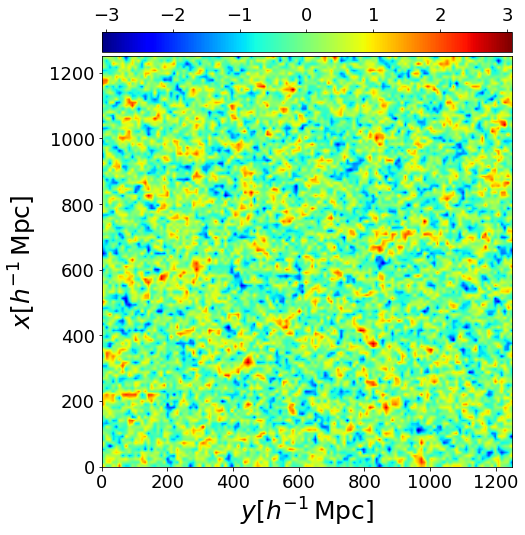

------------------------------->
---->iteration=26
mu=-0.286622
fmean=0.243563
leapfrog-boost integrator
HMC evaluations=3
logk=1037053.667714 logp=813107.794505 loglike=277380.171921
logk=1047720.377827 logp=799438.963131 loglike=280382.545608
Hf=2127541.634140 Hi=2127541.886566
dH=-0.252427
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=212


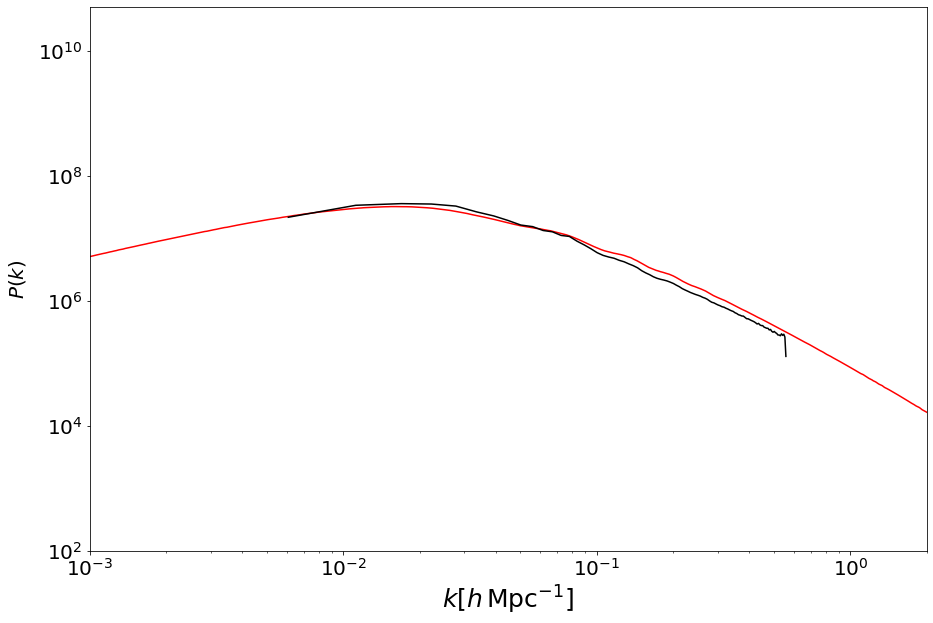

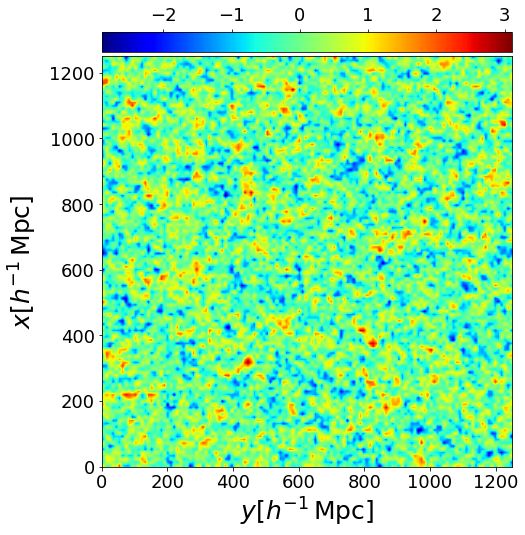

------------------------------->
---->iteration=27
mu=-0.290457
fmean=0.243216
leapfrog-boost integrator
HMC evaluations=2
logk=1043749.225891 logp=818933.588601 loglike=274362.389443
logk=1048051.330484 logp=813107.794505 loglike=275886.191636
Hf=2137045.203935 Hi=2137045.316625
dH=-0.112690
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=219


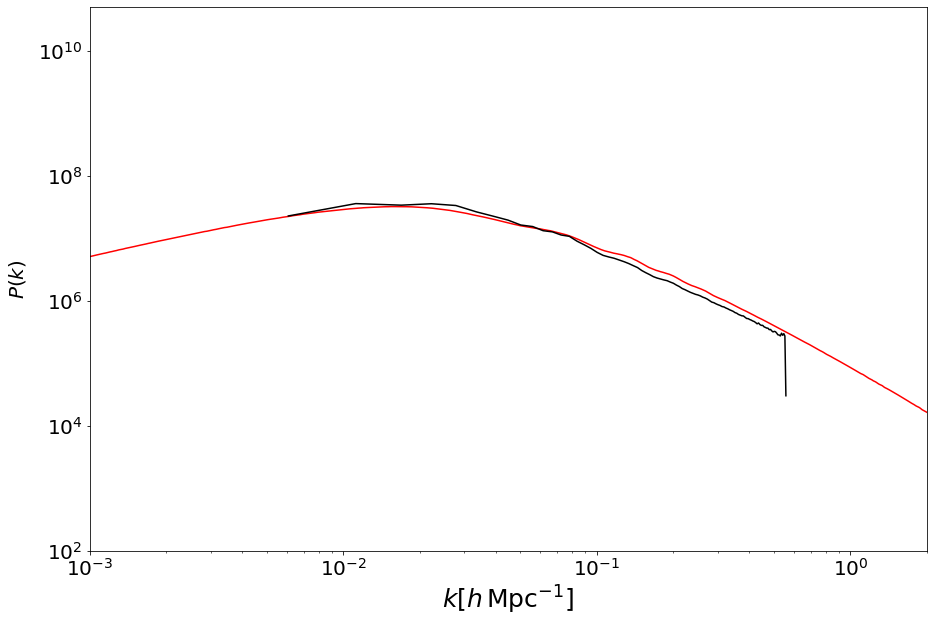

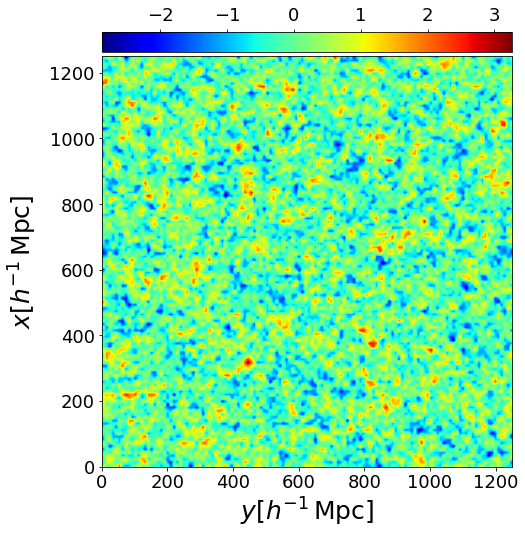

------------------------------->
---->iteration=28
mu=-0.292263
fmean=0.243017
leapfrog-boost integrator
HMC evaluations=1
logk=1047065.808537 logp=820445.713220 loglike=273304.352181
logk=1048306.006152 logp=818933.588601 loglike=273576.315531
Hf=2140815.873938 Hi=2140815.910284
dH=-0.036346
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=223


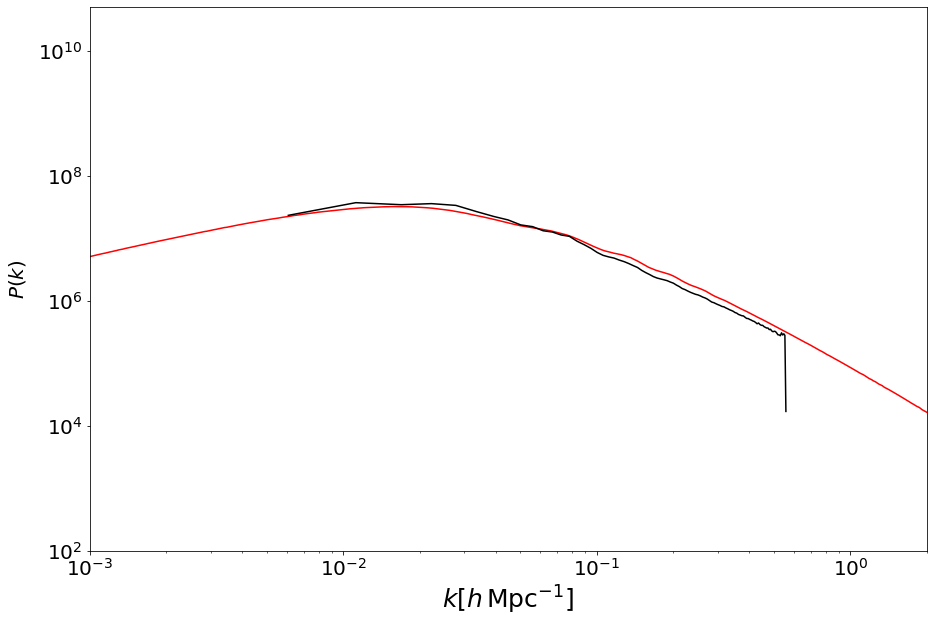

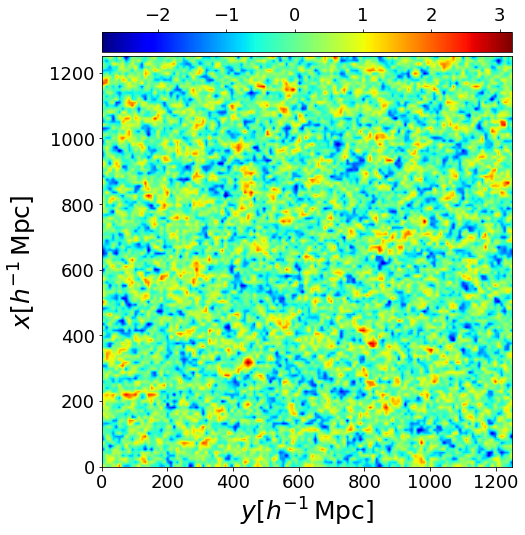

------------------------------->
---->iteration=29
mu=-0.292746
fmean=0.242963
leapfrog-boost integrator
HMC evaluations=4
logk=1029692.529985 logp=844016.828901 loglike=267836.875201
logk=1048008.712415 logp=820445.713220 loglike=273092.316333
Hf=2141546.234087 Hi=2141546.741969
dH=-0.507881
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=236


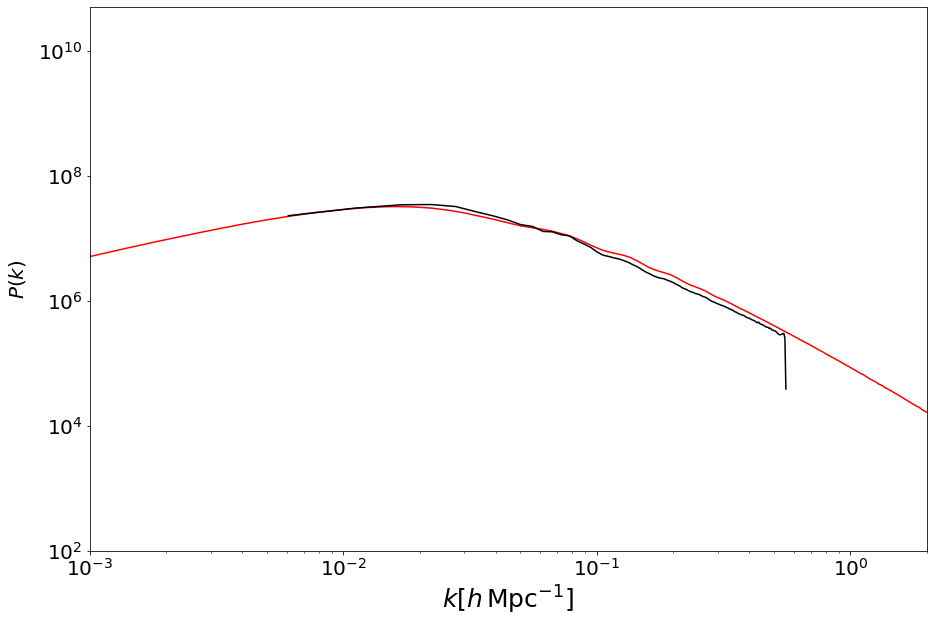

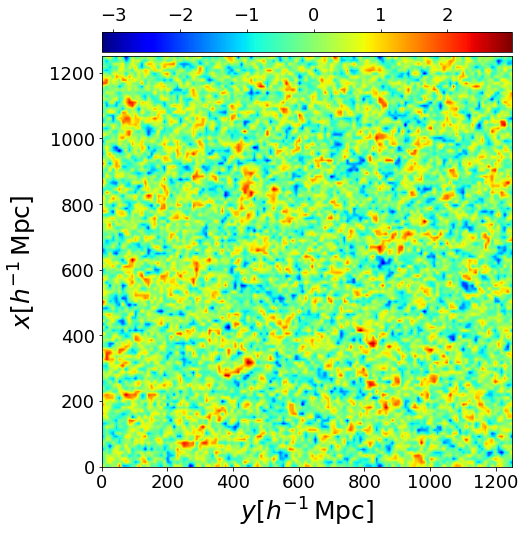

------------------------------->
---->iteration=30
mu=-0.299460
fmean=0.242287
leapfrog-boost integrator
HMC evaluations=3
logk=1039814.438815 logp=853836.612685 loglike=262393.505193
logk=1046992.568908 logp=844016.828901 loglike=265035.370134
Hf=2156044.556693 Hi=2156044.767943
dH=-0.211250
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=246


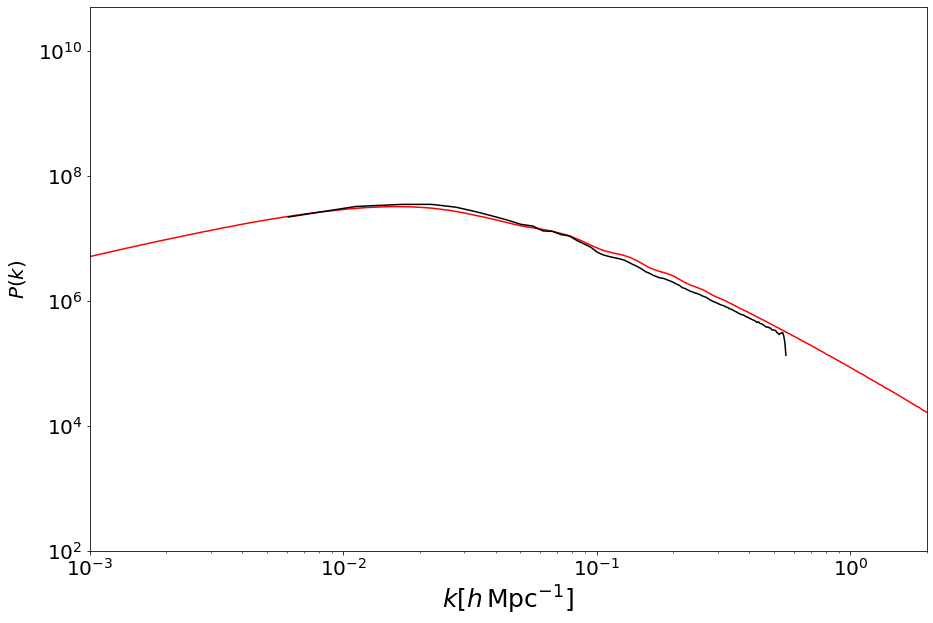

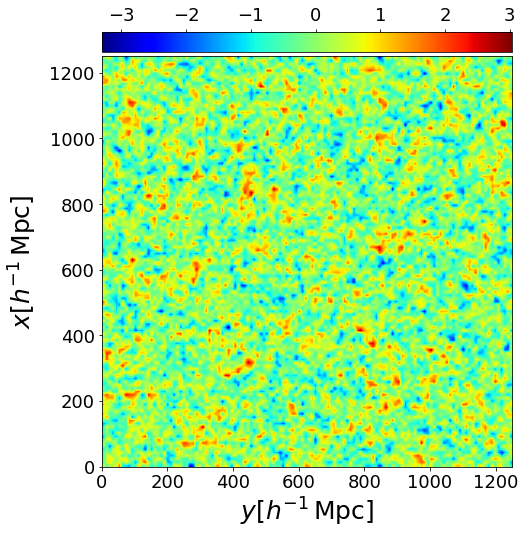

------------------------------->
---->iteration=31
mu=-0.302503
fmean=0.241980
leapfrog-boost integrator
HMC evaluations=4
logk=1033659.986522 logp=872330.093993 loglike=257393.947460
logk=1048418.736237 logp=853836.612685 loglike=261129.109559
Hf=2163384.027975 Hi=2163384.458480
dH=-0.430505
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=259


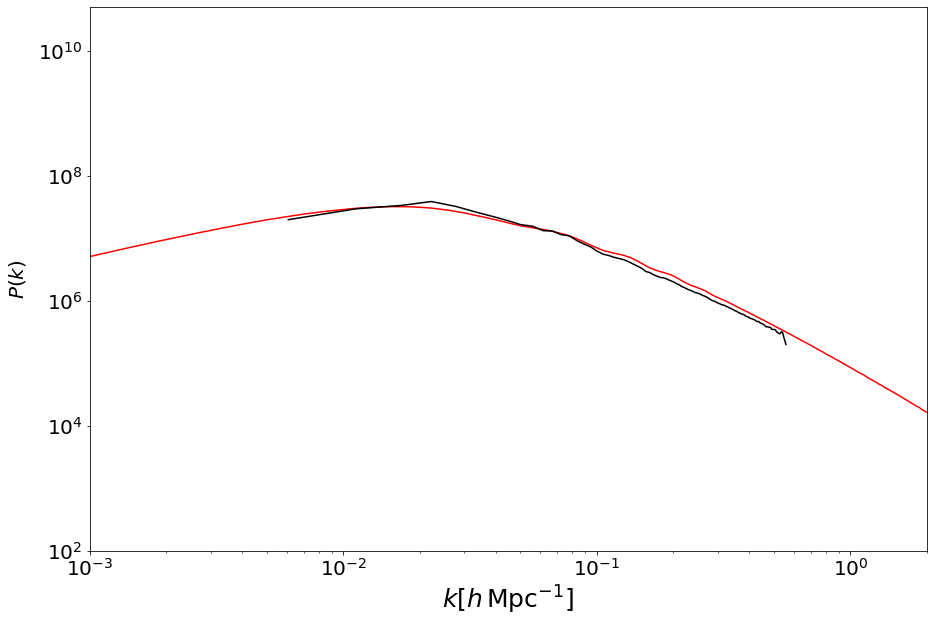

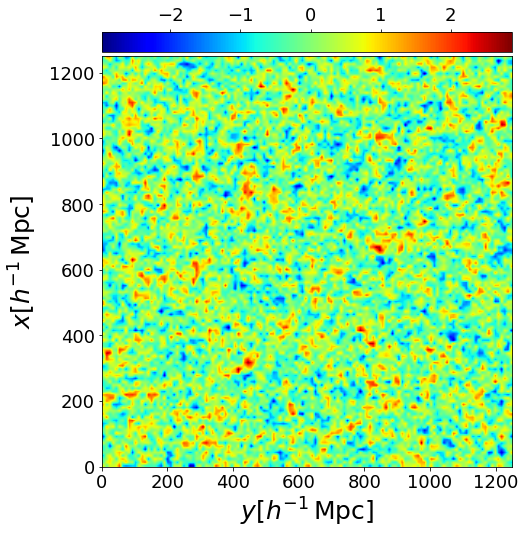

------------------------------->
---->iteration=32
mu=-0.307961
fmean=0.241418
leapfrog-boost integrator
HMC evaluations=1
logk=1048061.979505 logp=873500.899911 loglike=254790.658421
logk=1048935.788563 logp=872330.093993 loglike=255087.684417
Hf=2176353.537837 Hi=2176353.566972
dH=-0.029135
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=263


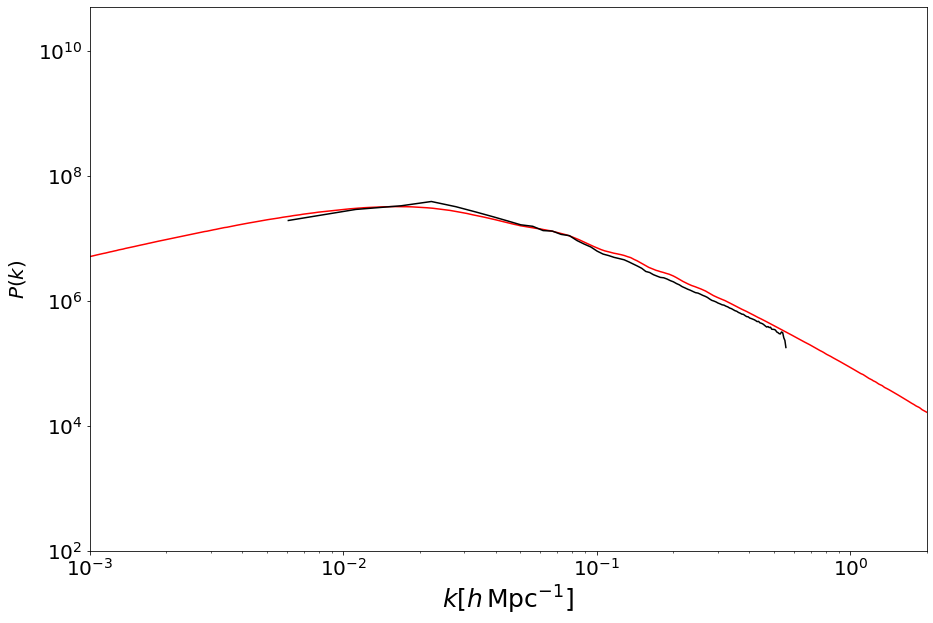

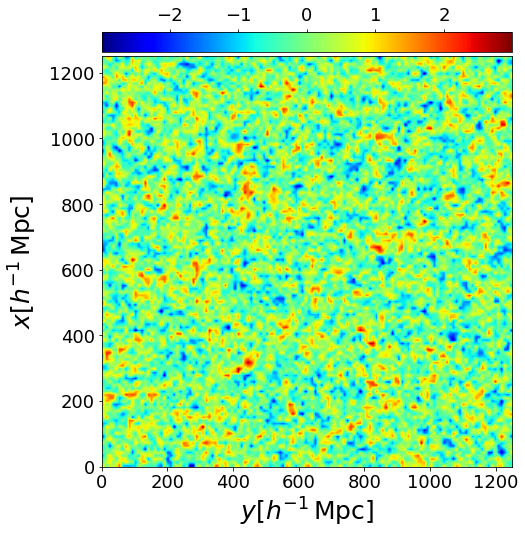

------------------------------->
---->iteration=33
mu=-0.308261
fmean=0.241393
leapfrog-boost integrator
HMC evaluations=2
logk=1046956.934706 logp=876790.805955 loglike=253821.937231
logk=1049389.083788 logp=873500.899911 loglike=254679.785390
Hf=2177569.677892 Hi=2177569.769089
dH=-0.091197
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=270


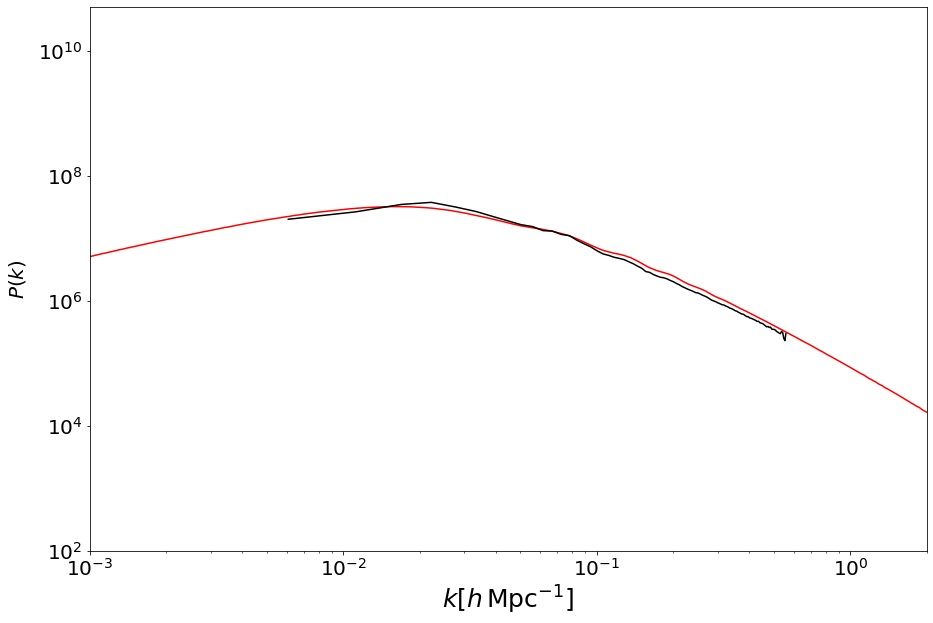

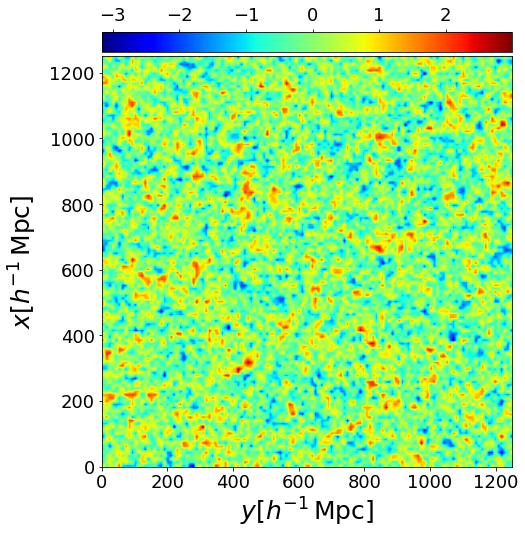

------------------------------->
---->iteration=34
mu=-0.309301
fmean=0.241299
leapfrog-boost integrator
HMC evaluations=1
logk=1047975.878043 logp=877736.003862 loglike=253129.792729
logk=1048635.085971 logp=876790.805955 loglike=253415.810663
Hf=2178841.674634 Hi=2178841.702589
dH=-0.027956
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=274


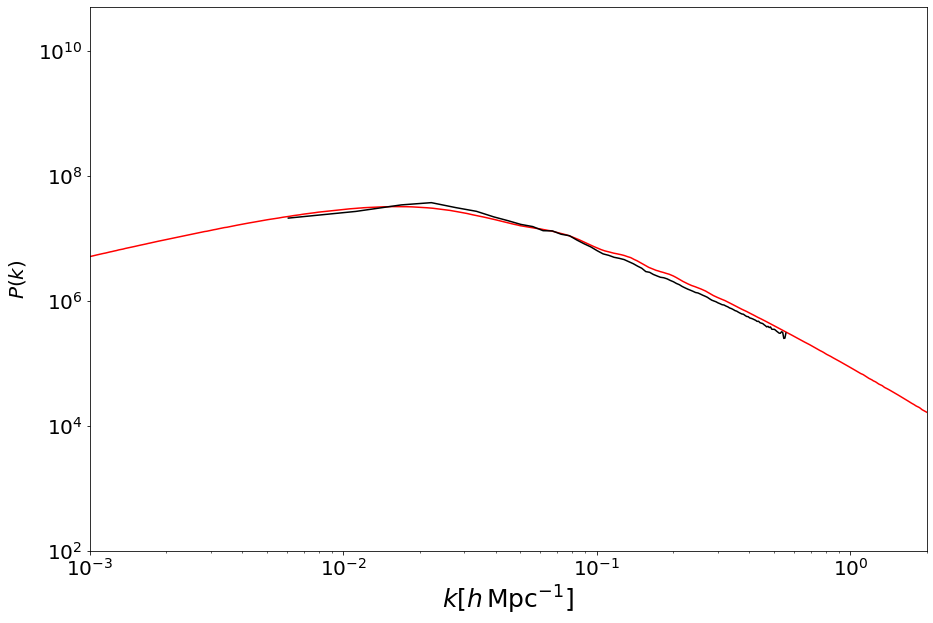

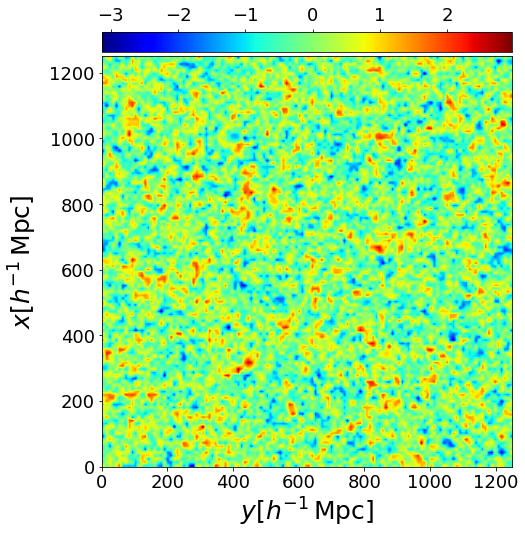

------------------------------->
---->iteration=35
mu=-0.309636
fmean=0.241260
leapfrog-boost integrator
HMC evaluations=2
logk=1045386.659188 logp=881813.176525 loglike=252151.979816
logk=1048636.233402 logp=877736.003862 loglike=252979.655116
Hf=2179351.815530 Hi=2179351.892380
dH=-0.076850
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=281


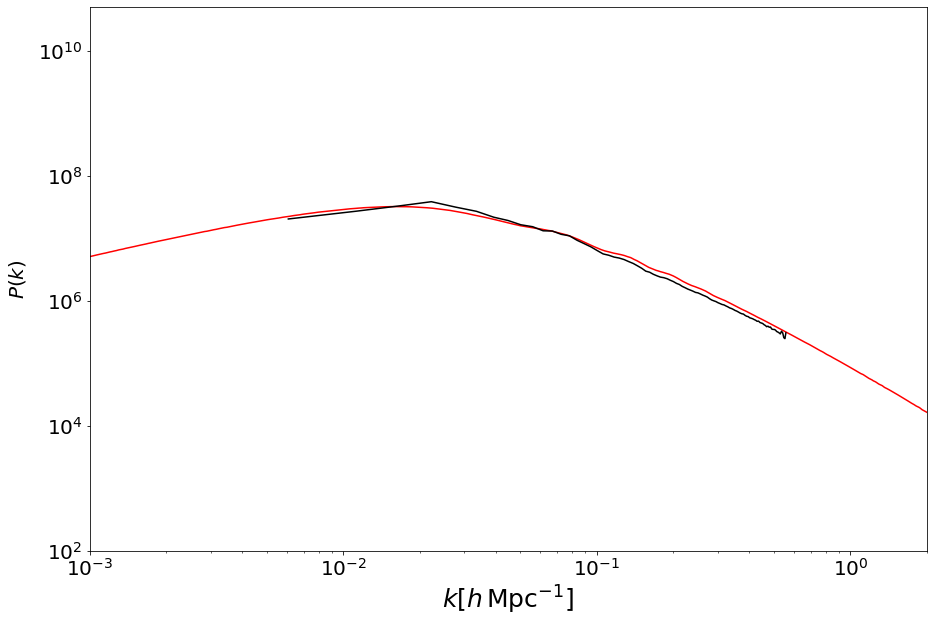

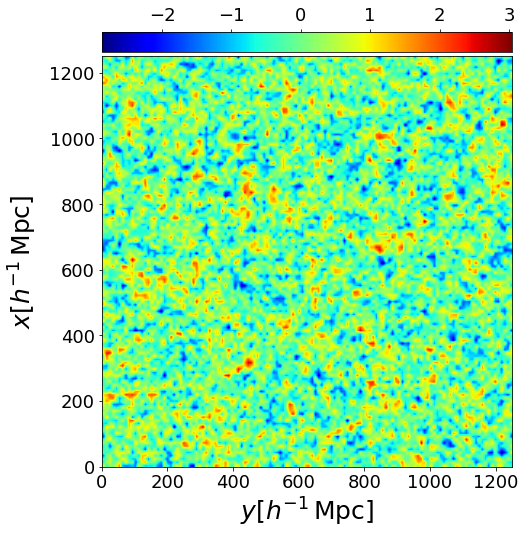

------------------------------->
---->iteration=36
mu=-0.310790
fmean=0.241150
leapfrog-boost integrator
HMC evaluations=4
logk=1038526.729972 logp=896032.430343 loglike=248136.184787
logk=1049192.791033 logp=881813.176525 loglike=251689.676068
Hf=2182695.345101 Hi=2182695.643626
dH=-0.298525
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=294


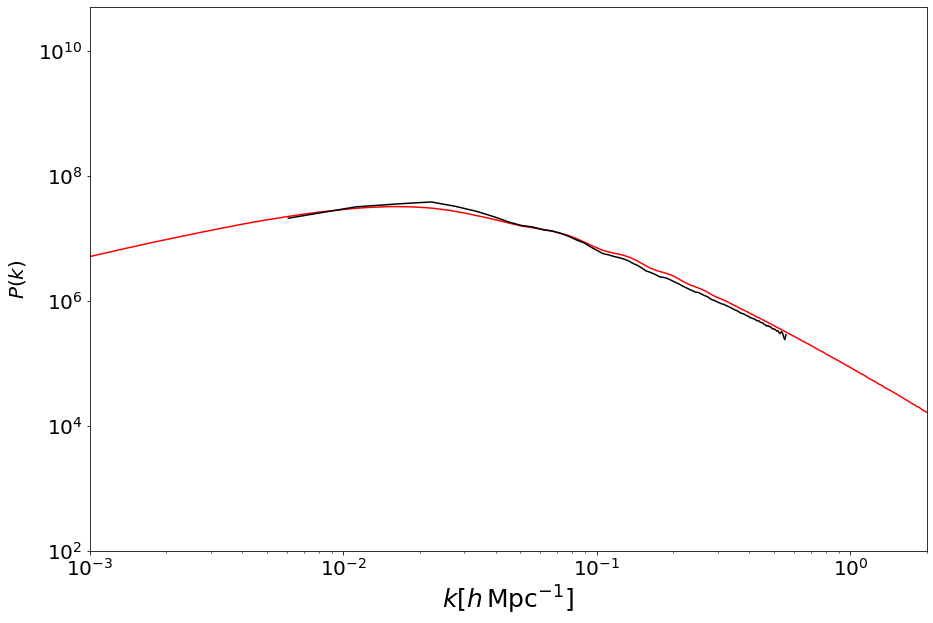

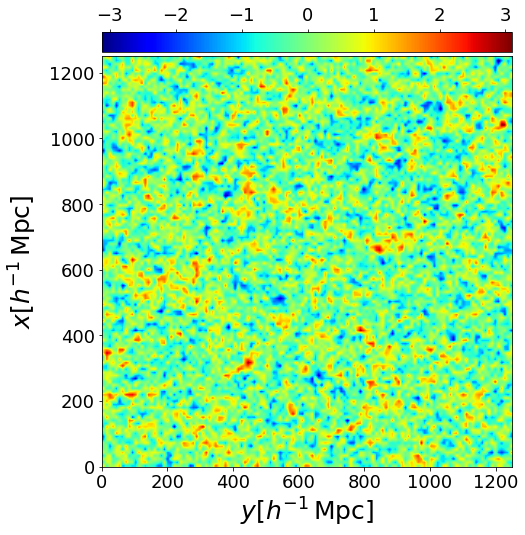

------------------------------->
---->iteration=37
mu=-0.314864
fmean=0.240711
leapfrog-boost integrator
HMC evaluations=3
logk=1043579.484109 logp=902434.237551 loglike=244351.911900
logk=1047965.212724 logp=896032.430343 loglike=246368.131024
Hf=2190365.633559 Hi=2190365.774090
dH=-0.140531
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=304


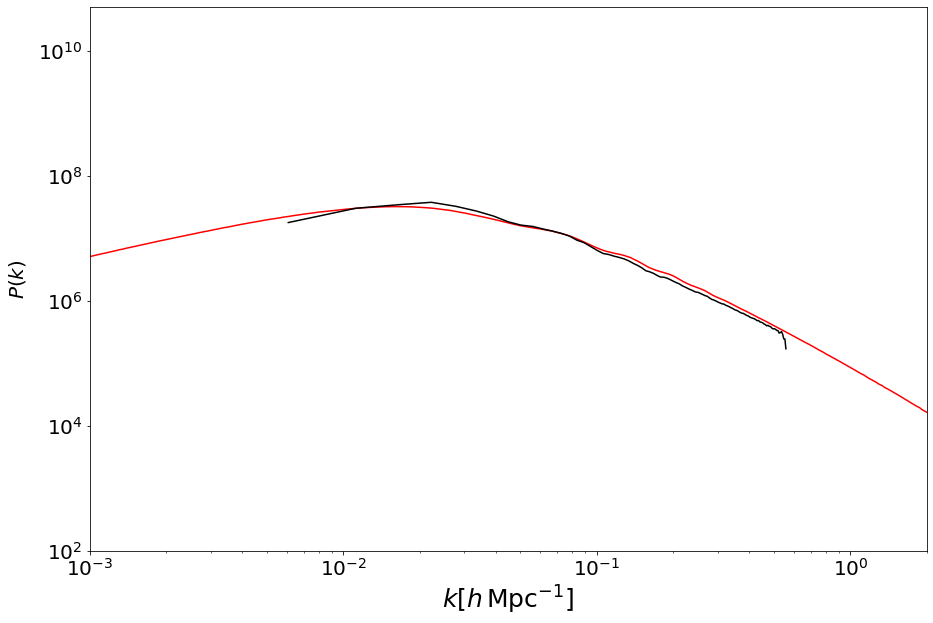

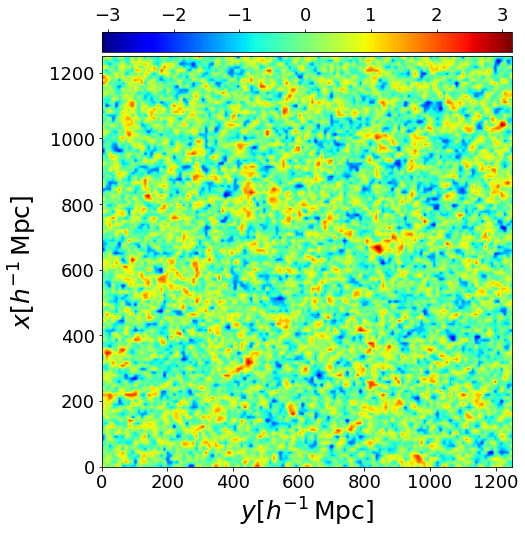

------------------------------->
---->iteration=38
mu=-0.317043
fmean=0.240490
leapfrog-boost integrator
HMC evaluations=1
logk=1047173.476139 logp=903176.008838 loglike=243145.697141
logk=1047618.351180 logp=902434.237551 loglike=243442.600774
Hf=2193495.182118 Hi=2193495.189505
dH=-0.007387
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=308


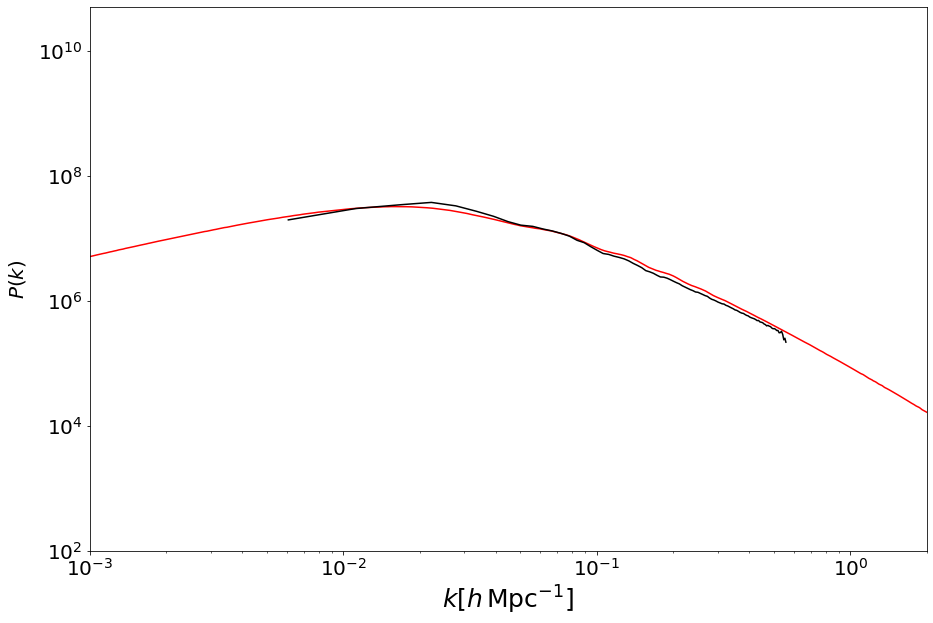

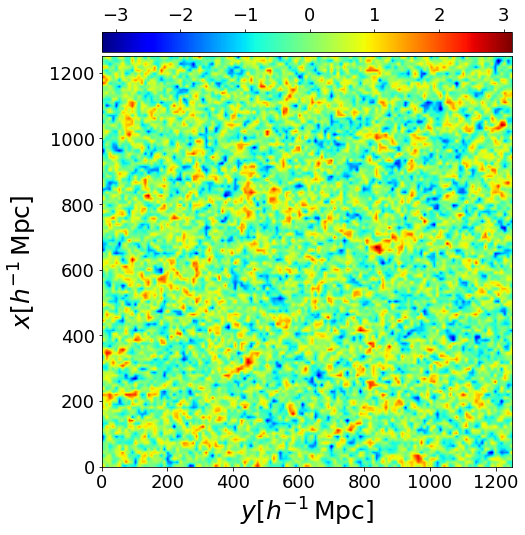

------------------------------->
---->iteration=39
mu=-0.317172
fmean=0.240486
leapfrog-boost integrator
HMC evaluations=2
logk=1045448.771209 logp=906841.761718 loglike=242213.254682
logk=1048213.480387 logp=903176.008838 loglike=243114.352508
Hf=2194503.787609 Hi=2194503.841733
dH=-0.054124
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=315


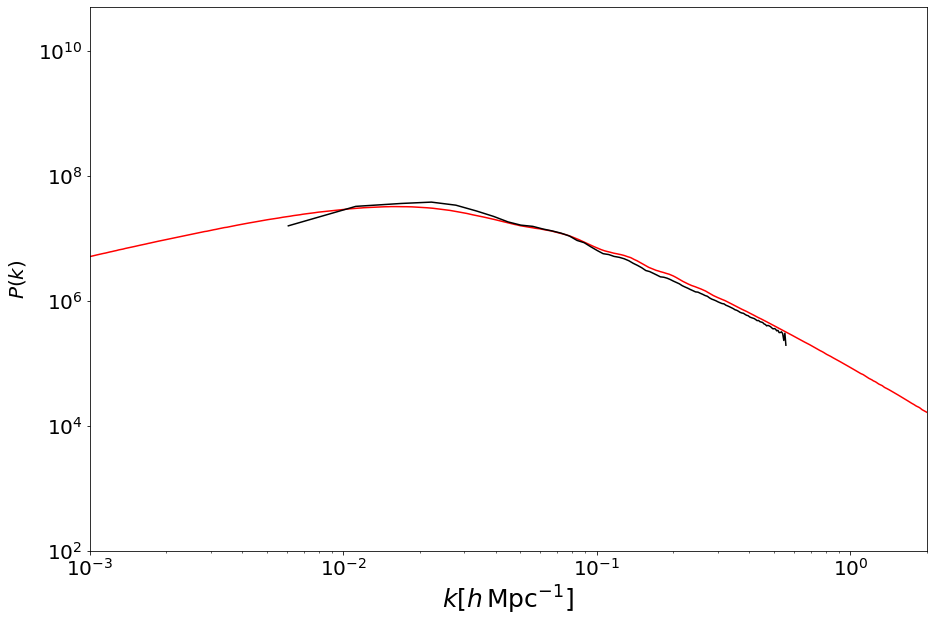

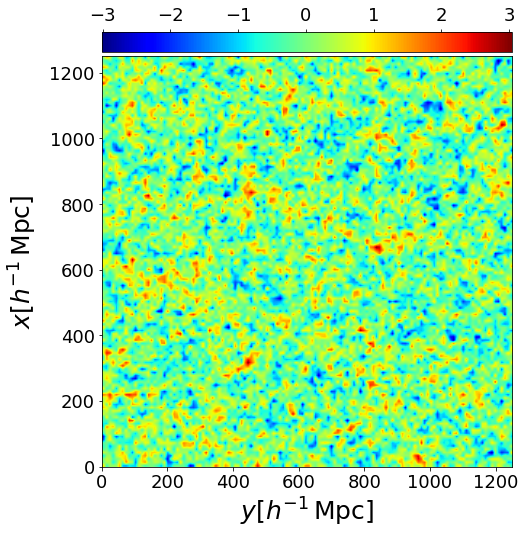

------------------------------->
---->iteration=40
mu=-0.318054
fmean=0.240417
leapfrog-boost integrator
HMC evaluations=1
logk=1047676.431179 logp=907722.603195 loglike=241594.429281
logk=1048255.183981 logp=906841.761718 loglike=241896.551176
Hf=2196993.463655 Hi=2196993.496875
dH=-0.033220
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=319


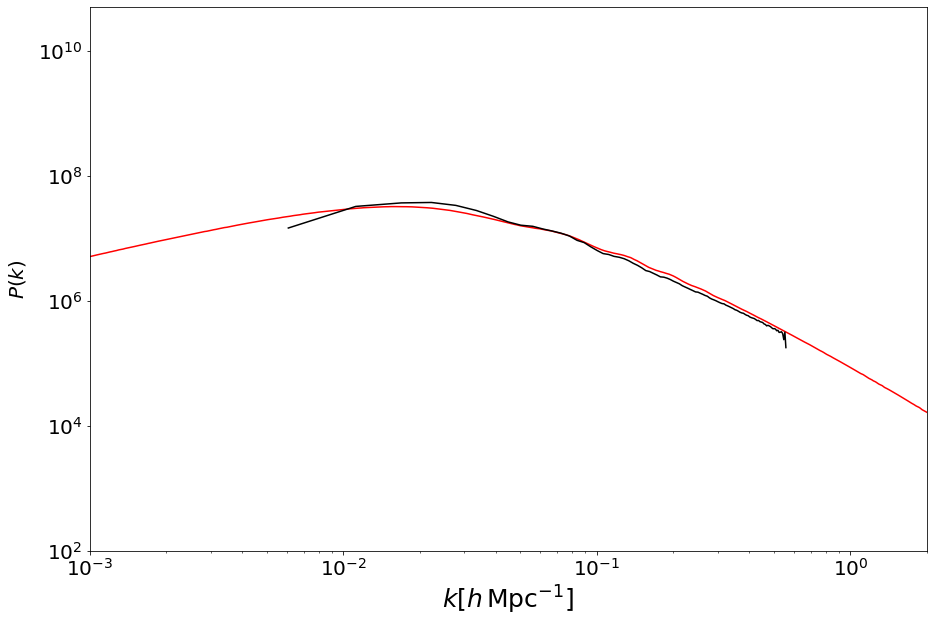

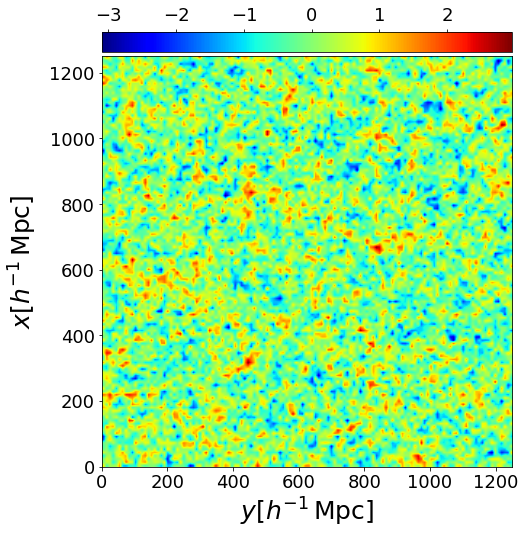

------------------------------->
---->iteration=41
mu=-0.318353
fmean=0.240377
leapfrog-boost integrator
HMC evaluations=2
logk=1046060.594832 logp=910100.959258 loglike=240738.888577
logk=1047731.222161 logp=907722.603195 loglike=241446.645727
Hf=2196900.442667 Hi=2196900.471083
dH=-0.028416
uacc= 1 pacc= 1.0
accepted!
------------------------------->
HMC iterations=1
------------------------------->
total HMC gradient evaluations=326


In [ ]:

try:

  if leapfrogboost==True:
    print("leapfrog-boost integrator")

  else:

    if higherorder==False: 
      print("2nd order integrator")
    else:
      print("4th order integrator")

  muG=calc_mu(deltadmG, nc)

  print("muG=%f"%(muG))

  signal=np.zeros((nc,nc,nc))
  signalf=signal
    
  if inverseCrime==False:
      bias = bias * bias_corr

  print("------------------------------->")
  print("Bayesian inference--->")
  signalf=Gibbs_sampling(higherorder,signal, Nobs, pk, Ngibbs, nc, L, NmeanG, fmean, muG, bias, Nb, filename, seed, normiK, normiM, normMom, stepsize, Nsteps, nrep, vmin, vmax)

  print("------------------------------->")
  print("Plot data again for comparison--->")
  plotdiagn(deltaobs, 0, nc, L, Nb, vminn, vmaxn, False, True)



except KeyboardInterrupt:
    pass

